In [1]:
import pandas as pd
import numpy as np
import json
from collections import Counter

In [2]:
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.express as px
from plotly.offline import init_notebook_mode, iplot
from plotly.colors import n_colors

In [3]:
from IPython.core.display import display, HTML, Javascript 
import IPython.display
from IPython.display import display, clear_output

C:\Users\u10025\AppData\Local\Temp\ipykernel_19376\3235063939.py:1: DeprecationWarning:

Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display



In [5]:
import ipywidgets as widgets
from ipywidgets import interact, interact_manual
import matplotlib as mpl
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [6]:
df = pd.read_csv("kaggle_survey_2022_responses.csv")

In [7]:
questions_titles =  df[0:1]
df = df[1:]

In [8]:
def create_scatter_plot(
    x_axis_values,
    y_axis_values, 
    hover_template,
    marker_color, 
    marker_size, 
    title,
    subtitle,
    subtitle_explain):
    """It creates a Scatter Plot."""
    
    
    trace = go.Scatter(
        x=x_axis_values, 
        y=y_axis_values,
        mode='markers', 
        hovertemplate=hover_template,
        marker=dict(
            color=marker_color,
            size=marker_size,
            showscale=True,
            colorbar=dict(title="Percent"),
            opacity=0.7,
            colorscale = 'RdBu_r'
        )
    )

   
    layout = go.Layout(
        width=900, 
        height=950, 
        plot_bgcolor="#fff", 
        paper_bgcolor="#fff", 
        showlegend = False, 
        title = {
            'text' : f"<span style='font-size:30px; font-family:Times New Roman'>{title}</span><br><br><sup>{subtitle}</sup><br><sup>{subtitle_explain}</sup>", 
            'x':0.5,
            'xanchor': 'center'
        }, 
        font = {"color" : '#7b6b59'},
        margin = dict(t=170),
    )
    
    fig = go.Figure(data = [trace], layout = layout)
    
    fig.update_xaxes(
        showline=False,
        linewidth=1,
        linecolor='#c9c4c3',
        gridcolor='#c9c4c3',
        tickfont=dict(size=14, family='Verdana', color='#7b6b59'), 
        title="",
        title_font=dict(size=14, family='Verdana', color='#f57369'),
        showgrid=False, 
        tickangle=325
    )
    fig.update_yaxes(
        showline=False,
        linewidth=1,
        linecolor='#000',
        gridcolor='#fff',
        tickfont=dict(size=14, family='Verdana', color='#a43725'), 
        title="",
        title_font=dict(size=14, family='Verdana', color='#f57369'),
        showgrid=False
    )

    fig.show()


def get_bar_plot_trace(x_values, y_values, display_text, top_n, rest_n, hovertext, orientation="h"):
    """It creates the trace for a bar plot."""
    
    trace = go.Bar(
        y = y_values,
        x = x_values,
        name = "",
        orientation = orientation,
        marker = dict(color = ["#E6b6a4"]*rest_n +  ["#a43725"]*top_n),
        text = display_text,
        texttemplate =  "<b style='color: #fff'>%{text}% </b>",
        textposition = ["outside"]*rest_n + ["inside"]*top_n,
        hovertext=hovertext
    )
    
    return trace


def create_single_bar_plot(x_values, y_values, display_text, top_n, rest_n, hovertext, title, subtitle="", orientation="h"):
    """It creates single bar plots."""

    trace = get_bar_plot_trace(x_values, y_values, display_text, top_n, rest_n, hovertext, orientation)

    large_title_format = f"<span style='font-size:30px; font-family:Times New Roman'>{title}</span>"
    
    layout = dict(
        title = large_title_format,
        font = dict(color = '#7b6b59'),
        margin = dict(t=120),
        yaxis={'categoryorder':'array','categoryarray': x_values},
        xaxis=dict(side="top", zerolinecolor = "#4d4d4d", zerolinewidth = 0.5, gridcolor="#e7e7e7", tickformat=",.1%"),
        width = 800,
        height= 700,
        plot_bgcolor = "white"
    )

    fig = go.Figure(data = trace, layout = layout)
    fig.show()
    
    
def create_box_plot(df, x_column_name, y_column_name, title):
    """It creates bar plots."""

    fig = px.box(
        df, 
        x=x_column_name, 
        y=y_column_name,
        title=f"<span style='font-size:30px; color:#7b6b59; font-family:Times New Roman'>{title}</span>")

    layout = go.Layout(
        xaxis= {"title": ""},
        yaxis= {"title": "Compensation in USD"},
        font = dict(color = 'black'),
        paper_bgcolor='rgba(0,0,0,0)',
        plot_bgcolor='rgba(0,0,0,0)',
        height=800,
        width=1050
    )

    fig.update_layout(layout)
    fig.update_yaxes(showline=True, linewidth=1, gridcolor='lightgrey')
    fig.update_traces(marker_color='#b39a74')

    fig.show() 

def create_heatmap(z, x, y, annotation_text, color_scale, title, subtitle="", xlabel="", ylabel=""):
    """It creates a heatmap."""

    fig = ff.create_annotated_heatmap(z, x=x, y=y, annotation_text=annotation_text,  colorscale=color_scale)

    large_title_format = f"<span style='font-size:30px; font-family:Times New Roman'>{title}</span>"
    small_title_format = f"<span style='font-size:14px; font-family:Helvetica'>{subtitle}</b></span>"


    layout = dict(
        title = large_title_format + "<br>" + small_title_format,
        font = dict(color = '#7b6b59'),
         xaxis= {"title": xlabel},
        yaxis= {"title": ylabel},

    )

    fig['layout'].update(layout)
    fig["layout"]["xaxis"].update(side="bottom")
    fig.show()

In [9]:
map_ml_adoption = {
    "No (we do not use ML methods)": "Not Started" , 
    "We are exploring ML methods (and may one day put a model into production)": "Exploration Stage",
    "We use ML methods for generating insights (but do not put working models into production)": "Generating Insights", 
    "We recently started using ML methods (i.e., models in production for less than 2 years)": "Models in Production",
    "We have well established ML methods (i.e., models in production for more than 2 years)": "Models in Production",
    "I do not know": "Not Known",
    np.nan: "Not Known"
}


ml_adoption_color_discrete_map={
    "Models in Production":"#a43725", 
    "Generating Insights": "#c07156", 
    "Exploration Stage":"#E6b6a4",
    "Not Started": "#e0d5bd",
    "Not Known": "#beb29e"
}


map_ml_usage = {
    "No (we do not use ML methods)": "0. Not Started<br><sup>(No ML)</sup>" , 
    "We are exploring ML methods (and may one day put a model into production)": "1. Exploration<br><sup>Only Exploring ML</sup>",
    "We use ML methods for generating insights (but do not put working models into production)": "2. Beginner Stage<br><sup>Use ML only for Insights</sup>", 
    "We recently started using ML methods (i.e., models in production for less than 2 years)": "3. Intermediate Stage<br><sup>Recently Started Using ML</sup>",
    "We have well established ML methods (i.e., models in production for more than 2 years)": "4. Advance Stage<br><sup>Well Established ML</sup>",
    "I do not know": "Not Known",
    np.nan: "Not Known"   
}


map_company_size = {
    "0-49 employees": "1. 0-49 employees" , 
    "50-249 employees": "2. 50-249 employees",
    "250-999 employees": "3. 250-999 employees",
    "1000-9,999 employees": "4. 1000-9,999 employees",
    "10,000 or more employees": "5. 10,000 or more employees",
    np.nan: np.nan   
}


map_programming_experience = {
    "I have never written code": "1. 0 years",
    "< 1 years": "2. < 1 years",
    "1-3 years": "3. 1-3 years",
    "3-5 years": "4. 3-5 years",
    "5-10 years": "5. 5-10 years",
    "10-20 years": "6. 10-20 years",
    "20+ years": "7. 20+ years",
    np.nan: np.nan
}


map_ml_experience = {
    "I do not use machine learning methods": "1. 0 years",
    "Under 1 year": "2. < 1 years",
    "1-2 years": "3. 1-2 years",
    "2-3 years": "4. 2-3 years",
    "3-4 years": "5. 3-4 years",
    "4-5 years": "6. 4-5 years",
    "5-10 years": "7. 5-10 years",
    "10-20 years": "8. 10-20 years",
    "20+ years": "9. 20+ years",
    np.nan: np.nan
}


map_data_team_size = {
    "0": "1. 0",
    "1-2": "2. 1-2",
    "3-4": "3. 3-4",
    "5-9": "4. 5-9",
    "10-14": "5. 10-14",
    "15-19": "6. 15-19",
    "20+": "7. 20+",
    np.nan: np.nan
}


countries_df = px.data.gapminder().query("year == 2007")
countries_df["country"] = countries_df["country"].str.strip()

map_country_continent = {
    "United States of America": "Americas", 
    "United Kingdom of Great Britain and Northern Ireland": "Europe",
    "South Korea": "Asia", 
    "Russia": "Europe",
    "Viet Nam": "Asia",
    "Hong Kong (S.A.R.)": "Asia",
    "Ukraine": "Europe",
    "United Arab Emirates": "Asia",
    "Iran, Islamic Republic of...": "Asia",
    
}


def fix_map_country_continent(map_countries: dict, country:str, continent:str):
    """It maps a country to its continent"""
    if country in map_countries:
        return map_countries[country]
    
    return continent


def usage_of_a_product_or_service(question_title: str, row: pd.Series, columns_list: list) -> str:
    """It takes as input a question title with multiple choices answers and checks
    if the respondent has selected at least one of the answers or not. 
    For instance, if we want to check if a respondent uses cloud computing platforms, question 31, then we should 
    check if the participant has selected any cloud computing platform choice Q31_1, Q31_2, etc. 
    """
    for col in columns_list:
        if col.startswith(question_title):

            if not pd.isnull(row[col]) and row[col].strip().lower() != "none":
                return "Yes"
    return "No"


def categorize_education(education:str) -> str:
    """Assigns more general categories to education levels."""
    if education in [
        "No formal education past high school", 
        "Some college/university study without earning a bachelor’s degree"
    ]:
        return "Lower than Bachelor"
    
    if education == "Bachelor’s degree":
        return "Bachelor"
    
    if education == "Master’s degree":
        return "Master"
    
    if education in ["Doctoral degree", "Professional doctorate"]:
        return "Higher than Master"
    
    return "Other"


def extract_and_count_all_the_multiple_choice_answers(question, df):
    """If we have a question with multiple choices it returns a data
    frame with the number of occurrences of each choice in the responses. 
    """
    
    choices_list = [choice for choice in df.columns if choice.startswith(question)]
    dfs_list = []
    for col in choices_list:
        dfs_list.append(df.groupby([col]).agg({"Q2" : "count"}).reset_index().rename(columns={col: question, "Q2": "counts"}))

    agg_df = pd.concat(dfs_list)
    agg_df["relative_percent"] = agg_df.apply(lambda x : (x["counts"] / df.shape[0]), axis = 1)
    agg_df = agg_df.sort_values(by=["relative_percent"], ascending=True)
    
    return agg_df


def assign_label(service:str):
    """It returns the company name to which the product belongs. 
    It takes care only of the 3 big techs: Google, Microsoft, Amazon.
    """
    
    if "google" in service.lower():
        return "Google"
    
    if "aws" in service.lower() or "amazon" in service.lower():
        return "Amazon"
    
    if "azure" in service.lower() or "microsoft" in service.lower():
        return "Microsoft"
    
    if "ibm" in service.lower():
        return "IBM"

    return "Other"


def extract_the_number_of_responses(question_title: str, row: pd.Series, columns_list: list) -> str:
    """It takes as input an answer from a multiple-choice question and counts the number 
    of respondents that have chosen it.
    """
    num_responses = 0 
    for col in columns_list:
        if col.startswith(question_title):
            if not pd.isnull(row[col]):
                num_responses = num_responses + 1 

    return num_responses


def wrap_df_text(df):
    return display(HTML(df.style.background_gradient(axis=0,  cmap='YlOrBr', subset=["Average number of selected choices"]).to_html().replace("\\n","<br>")))

In [10]:
scope_df = df[
    (df["Q5"] == "No") & 
    (df["Q24"].notnull()) &
    (df["Q23"] != "Currently not employed")
]


scope_df["ML_adoption_class"] = scope_df["Q27"].apply(lambda x : map_ml_adoption[x])

scope_df["ML_adoption"] = scope_df["Q27"].apply(lambda x : map_ml_usage[x])

scope_df["Q25"] = scope_df["Q25"].apply(lambda x : map_company_size[x])

scope_df["Cloud_usage"] = scope_df.apply(lambda row: usage_of_a_product_or_service("Q31", row, list(scope_df.columns)), axis=1)
scope_df["NLP_methods_usage"] = scope_df.apply(lambda row: usage_of_a_product_or_service("Q20", row, list(scope_df.columns)), axis=1)
scope_df["CV_methods_usage"] = scope_df.apply(lambda row: usage_of_a_product_or_service("Q19", row, list(scope_df.columns)), axis=1)
scope_df["GPU_usage"] = scope_df.apply(lambda row: usage_of_a_product_or_service("Q42", row, list(scope_df.columns)), axis=1)


scope_df["Q11"] = scope_df["Q11"].apply(lambda x : map_programming_experience[x])
scope_df["Q16"] = scope_df["Q16"].apply(lambda x : map_ml_experience[x])
scope_df["Q26"] = scope_df["Q26"].apply(lambda x : map_data_team_size[x])

industry_totals = scope_df["Q24"].value_counts().to_dict()

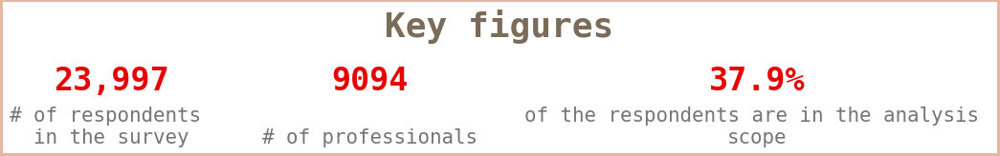

In [11]:
mpl.rcParams.update(mpl.rcParamsDefault)

fig1 = plt.figure(figsize=(5,2),facecolor='white')

ax1 = fig1.add_subplot(1,1,1)
font = 'monospace'
ax1.text(0.9, 0.8, "Key figures",color='#7b6b59',fontsize=26, fontweight='bold', fontfamily=font, ha='center')


ax1.text(0, 0.4, "{:,d}".format(df.shape[0]), color='#e60000', fontsize=24, fontweight='bold', fontfamily=font, ha='center')
ax1.text(0, 0.001, "# of respondents \nin the survey",color='#757575',fontsize=15, fontweight='light', fontfamily=font,ha='center')

ax1.text(0.6, 0.4, "{}".format(scope_df.shape[0]), color='#e60000', fontsize=24, fontweight='bold', fontfamily=font, ha='center')
ax1.text(0.6, 0.001, "# of professionals",color='#757575',fontsize=15, fontweight='light', fontfamily=font,ha='center')


ax1.text(1.5, 0.4, "{}".format(round((scope_df.shape[0]/df.shape[0] )*100, 2))+"%", color='#e60000', fontsize=24, fontweight='bold', fontfamily=font, ha='center')
ax1.text(1.5, 0.001, "of the respondents are in the analysis \nscope",color='#757575',fontsize=15, fontweight='light', fontfamily=font, ha='center')

ax1.set_yticklabels('')
ax1.tick_params(axis='y',length=0)
ax1.tick_params(axis='x',length=0)
ax1.set_xticklabels('')

for direction in ['top','right','left','bottom']:
    ax1.spines[direction].set_visible(False)

fig1.subplots_adjust(top=0.9, bottom=0.2, left=0, hspace=1)

fig1.patch.set_linewidth(3)
fig1.patch.set_edgecolor('#E6b6a4')
fig1.patch.set_facecolor('white')
ax1.set_facecolor('white')
    
plt.show()

In [12]:
multiple_choice_questions = {}
seen_columns = []

for col in df.columns:
    question = col.split("_")[0]
    if question in seen_columns:
        if question not in multiple_choice_questions:
            multiple_choice_questions[question] = 2
        else: 
            multiple_choice_questions[question] = multiple_choice_questions[question] + 1
    else:
        seen_columns.append(question)

for col in list(multiple_choice_questions.keys()):
    scope_df[f"{col}_number_of_responses"] = scope_df.apply(
        lambda x : extract_the_number_of_responses(col,x, df.columns), axis = 1)
    

In [13]:
respondents_mean_responses = scope_df[[f"{col}_number_of_responses" for col in list(multiple_choice_questions.keys())]].mean(axis = 1).reset_index().rename(columns={0: "Mean number of responses"})


outliers = scope_df.filter(items=respondents_mean_responses[respondents_mean_responses["Mean number of responses"] > 3]["index"].to_list(), axis=0)
outliers = outliers.groupby(
    ["Q16"]
).agg(
    {"Q2" : "count"}
).reset_index().rename(
    columns={"Q2": "Nbr of respondents", "Q16": "Years of Machine Learning Experience"}
).sort_values(by=["Years of Machine Learning Experience"])
outliers["%"] = outliers.apply(lambda x : x["Nbr of respondents"] / outliers["Nbr of respondents"].sum(), axis = 1)
outliers["%"] = np.round(outliers["%"]* 100, 2)
outliers.style.background_gradient(axis=0,  cmap='YlOrBr', subset=["%"])

,Years of Machine Learning Experience,Nbr of respondents,%
0,2. < 1 years,11,6.400000
1,3. 1-2 years,28,16.280000
2,4. 2-3 years,32,18.600000
3,5. 3-4 years,23,13.370000
4,6. 4-5 years,24,13.950000
5,7. 5-10 years,43,25.000000
6,8. 10-20 years,11,6.400000


In [14]:
outliers = scope_df.filter(items=respondents_mean_responses[respondents_mean_responses["Mean number of responses"] > 3]["index"].to_list(), axis=0)
outliers = outliers.groupby(
    ["Q11"]
).agg(
    {"Q2" : "count"}
).reset_index().rename(
    columns={"Q2": "Nbr of respondents", "Q11": "Years of Coding Experience"}
).sort_values(by=["Years of Coding Experience"])
outliers["%"] = outliers.apply(lambda x : x["Nbr of respondents"] / outliers["Nbr of respondents"].sum(), axis = 1)
outliers["%"] = np.round(outliers["%"]* 100, 2)
outliers.style.background_gradient(axis=0,  cmap='YlOrBr', subset=["%"])

,Years of Coding Experience,Nbr of respondents,%
0,2. < 1 years,10,5.810000
1,3. 1-3 years,31,18.020000
2,4. 3-5 years,25,14.530000
3,5. 5-10 years,45,26.160000
4,6. 10-20 years,36,20.930000
5,7. 20+ years,25,14.530000


In [15]:
outlier_analysis = []

for col in list(multiple_choice_questions.keys()):
    mean_responses = round(scope_df[f"{col}_number_of_responses"].mean())
    outlier_analysis.append([
        col,
        multiple_choice_questions[col], 
        mean_responses,
    ])
    
average_responses = pd.DataFrame(outlier_analysis, columns = ["Question", "Nbr of available Choices", "Average number of selected choices"])
average_responses["Question Title"] = questions_titles[[f"{col}_1" for col in list(multiple_choice_questions.keys())]].loc[0].to_list()
average_responses["Question Title"] = average_responses["Question Title"].apply(lambda x : x.split("(Select")[0].strip())

#Updates the DataFrame in place
scope_df.drop([f"{col}_number_of_responses" for col in list(multiple_choice_questions.keys())], axis = 1, inplace=True)

average_responses["Question Title"] = average_responses['Question Title'].str.wrap(80)
average_responses = average_responses[["Question", "Question Title", "Nbr of available Choices", "Average number of selected choices"]]
wrap_df_text(average_responses)

,Question,Question Title,Nbr of available Choices,Average number of selected choices
0,Q6,On which platforms have you begun or completed data science courses?,12,2
1,Q7,What products or platforms did you find to be most helpful when you first started studying data science?,7,2
2,Q10,"Did your research make use of machine learning? - Yes, the research made advances related to some novel machine learning method (theoretical research)",3,0
3,Q12,What programming languages do you use on a regular basis?,15,2
4,Q13,Which of the following integrated development environments (IDE's) do you use on a regular basis?,14,3
5,Q14,Do you use any of the following hosted notebook products?,16,1
6,Q15,Do you use any of the following data visualization libraries on a regular basis?,15,2
7,Q17,Which of the following machine learning frameworks do you use on a regular basis?,15,2
8,Q18,Which of the following ML algorithms do you use on a regular basis?,14,3
9,Q19,Which categories of computer vision methods do you use on a regular basis?,8,1


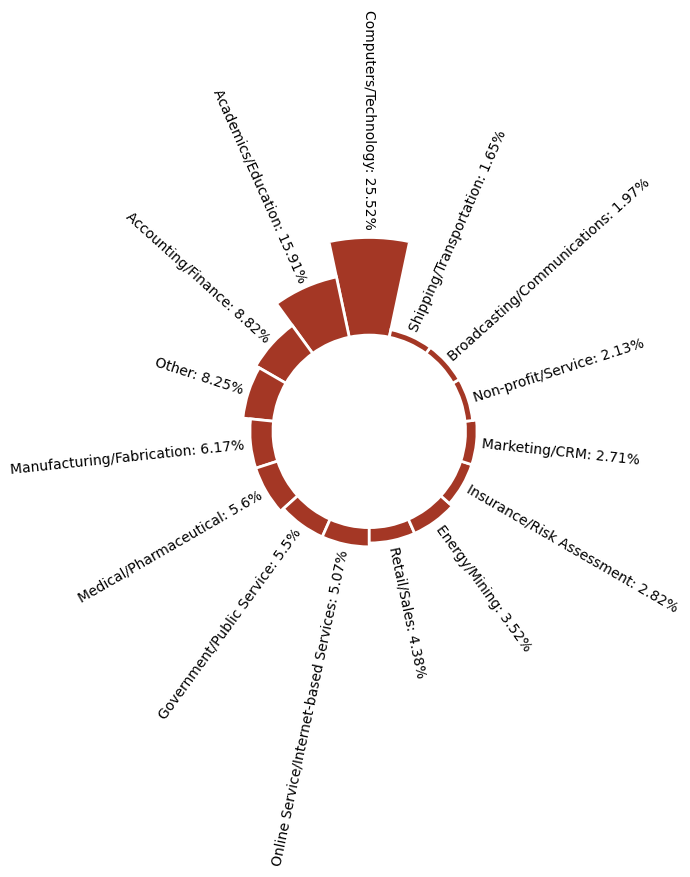

In [16]:
def get_label_rotation(angle, offset):
    rotation = np.rad2deg(angle + offset)
    if angle <= np.pi:
        alignment = "right"
        rotation = rotation + 180
    else: 
        alignment = "left"
    return rotation, alignment


def add_labels(angles, values, labels, offset, ax):
    padding = 6
    for angle, value, label, in zip(angles, values, labels):
        angle = angle
        rotation, alignment = get_label_rotation(angle, offset)
        y = value + padding
        ax.text(
            x=angle, 
            y=y, 
            s=label, 
            ha=alignment, 
            va="center", 
            rotation=rotation, 
            rotation_mode="anchor",

        ) 


ANGLES = np.linspace(0, 2 * np.pi, scope_df["Q24"].nunique(), endpoint=False)
VALUES = np.round(scope_df["Q24"].value_counts(normalize=True).values, 2)*400
LABELS = scope_df["Q24"].value_counts().index
WIDTH = 2 * np.pi / len(VALUES)

OFFSET = np.pi / 2

fig, ax = plt.subplots(figsize=(10, 5), subplot_kw={"projection": "polar"})
ax.set_theta_offset(OFFSET)
ax.set_ylim(-100, 100)
ax.set_frame_on(False)
ax.xaxis.grid(False)
ax.yaxis.grid(False)
ax.set_xticks([])
ax.set_yticks([])
ax.bar(
    ANGLES, VALUES, width=WIDTH, linewidth=2,
    color="#a43725", edgecolor="white"
)

final_labels = []
test = list(np.round(scope_df["Q24"].value_counts(normalize=True).values*100,2))
count = 0 
for label in LABELS:
    final_labels.append(f"{label}: {test[count]}%")
    count = count+ 1
np.array(final_labels)
add_labels(ANGLES, VALUES, final_labels, OFFSET, ax)
plt.show()

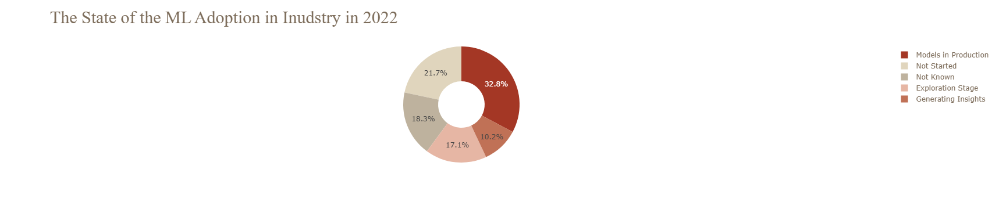

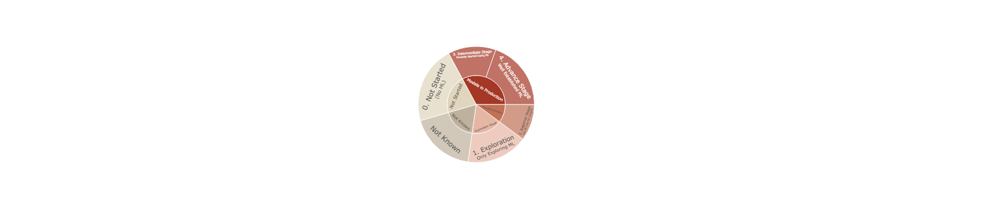

In [17]:
ml_adoption = scope_df.groupby(
    ["ML_adoption_class", "ML_adoption"]
).agg(
    {"Q2" : "count"}
).reset_index().rename(
    columns={"Q2": "counts"}
)

fig = go.Figure(data=[go.Pie(
    labels=scope_df["ML_adoption_class"].value_counts().index.to_list(), 
    values=list(scope_df["ML_adoption_class"].value_counts().values),
    hole=.4
)])

fig.update_traces(marker=dict(colors=['#a43725', '#e0d5bd', '#beb29e', '#E6b6a4', '#c07156']))

large_title_format = "<span style='font-size:30px; font-family:Times New Roman'>The State of the ML Adoption in Inudstry in 2022</span>"
small_title_format = "<span style='font-size:14px; font-family:Helvetica'></b></span>"

layout = dict(
    title = large_title_format + "<br>" + small_title_format,
    font = dict(color = '#7b6b59'),
    showlegend = True,
    margin = dict(t=80,pad=0),

)
fig["layout"].update(layout)

fig.show()

## Second Plot
fig = px.sunburst(
    ml_adoption, 
    path=["ML_adoption_class", "ML_adoption"], 
    values="counts", 
    color="ML_adoption_class",
    color_discrete_map=ml_adoption_color_discrete_map
)

layout = dict(
    showlegend = False,
    margin = dict(t=80,pad=0, l=0),

)
fig["layout"].update(layout)

fig.show()

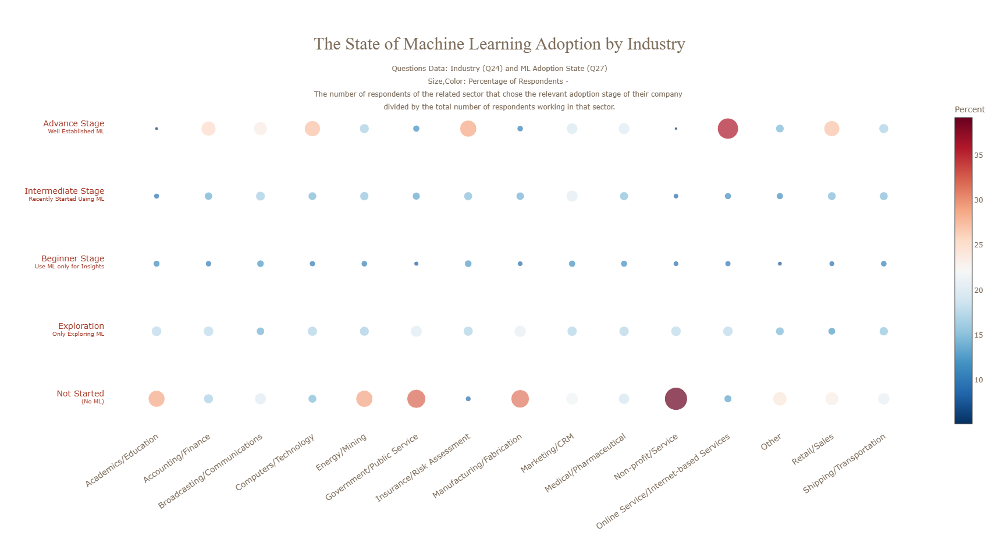

In [19]:
ai_adoption_totals = scope_df["Q24"].value_counts().to_dict()

ai_adoption = scope_df.groupby(["Q24", "ML_adoption"]).agg({"Q2" : "count"}).reset_index().rename(columns={"Q2": "counts"})

ai_adoption["relative_percent"] = ai_adoption.apply(lambda x : x["counts"] / ai_adoption_totals[x["Q24"]], axis = 1)
 
ai_adoption = ai_adoption[ai_adoption["ML_adoption"]!= "Not Known"]

hover_template = "Industry: %{x}<br>" + "AI Adoption Stage: %{y}<br>" + "Percentage: %{marker.size:,}" + "<extra></extra>"

create_scatter_plot(
    ai_adoption["Q24"],
    ai_adoption["ML_adoption"].apply(lambda x : x.split(".")[-1]), 
    hover_template,
    ai_adoption['relative_percent']*100, 
    ai_adoption['relative_percent']*100, 
    "The State of Machine Learning Adoption by Industry",
    "Questions Data: Industry (Q24) and ML Adoption State (Q27)",
    "Size,Color: Percentage of Respondents - <br>The number of respondents of the related sector that chose the relevant adoption stage of their company <br>divided by the total number of respondents working in that sector."
)

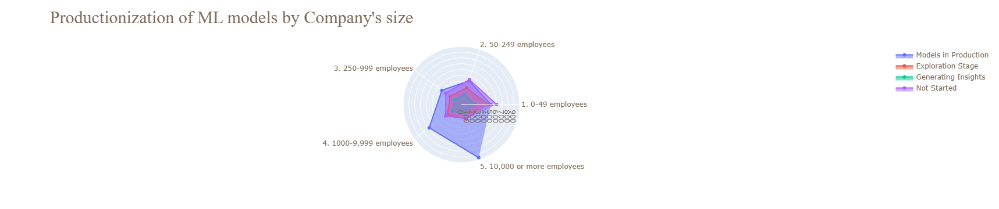

In [20]:
adoption_per_company_size = scope_df.groupby(
    ["Q25", "ML_adoption_class"]
).agg({
    "Q2" : "count"
}).reset_index().rename(columns={
    "Q2": "counts"
})
adoption_per_company_size

fig = go.Figure()

fig.add_trace(go.Scatterpolar(
      r=adoption_per_company_size[adoption_per_company_size["ML_adoption_class"] == "Models in Production"].sort_values(by=["Q25"])["counts"].to_list(),
      theta=adoption_per_company_size[adoption_per_company_size["ML_adoption_class"] == "Models in Production"].sort_values(by=["Q25"])["Q25"].to_list(),
      fill='toself',
      name='Models in Production'
))
fig.add_trace(go.Scatterpolar(
      r=adoption_per_company_size[adoption_per_company_size["ML_adoption_class"] == "Exploration Stage"].sort_values(by=["Q25"])["counts"].to_list(),
      theta=adoption_per_company_size[adoption_per_company_size["ML_adoption_class"] == "Exploration Stage"].sort_values(by=["Q25"])["Q25"].to_list(),
      fill='toself',
      name='Exploration Stage'
))

fig.add_trace(go.Scatterpolar(
      r=adoption_per_company_size[adoption_per_company_size["ML_adoption_class"] == "Generating Insights"].sort_values(by=["Q25"])["counts"].to_list(),
      theta=adoption_per_company_size[adoption_per_company_size["ML_adoption_class"] == "Generating Insights"].sort_values(by=["Q25"])["Q25"].to_list(),
      fill='toself',
      name='Generating Insights'
))

fig.add_trace(go.Scatterpolar(
      r=adoption_per_company_size[adoption_per_company_size["ML_adoption_class"] == "Not Started"].sort_values(by=["Q25"])["counts"].to_list(),
      theta=adoption_per_company_size[adoption_per_company_size["ML_adoption_class"] == "Not Started"].sort_values(by=["Q25"])["Q25"].to_list(),
      fill='toself',
      name='Not Started'
))

large_title_format = "<span style='font-size:30px; font-family:Times New Roman'>Productionization of ML models by Company's size</span>"
small_title_format = "<span style='font-size:14px; font-family:Helvetica'></b></span>"


layout = dict(
    title = large_title_format + "<br>" + small_title_format,
    font = dict(color = '#7b6b59'),
    showlegend = True,
    margin = dict(t=80,pad=6),

)
fig["layout"].update(layout)

fig.show()

In [21]:
cloud_usage = scope_df.groupby(
    ["Cloud_usage"]
).agg({
    "Q2" : "count"
}).reset_index().rename(columns={
    "Q2": "Nbr of respondents",
    "Cloud_usage": "Usage of Cloud Computing Platforms"
})
cloud_usage["%"] = np.round((cloud_usage["Nbr of respondents"] / scope_df.shape[0]) * 100, 2)
cloud_usage.style.background_gradient(axis=0,  cmap='Blues')

,Usage of Cloud Computing Platforms,Nbr of respondents,%
0,No,4994,54.920000
1,Yes,4100,45.080000


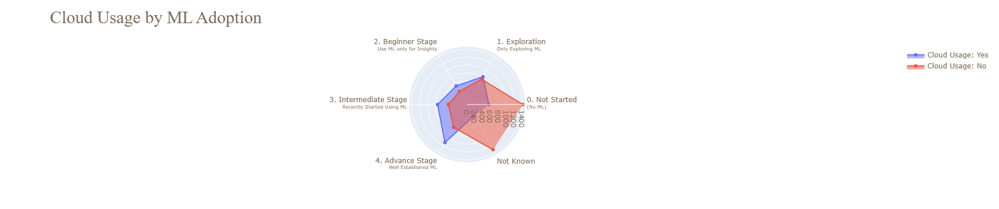

In [22]:
usage_per_adoption = scope_df.groupby(
    ["ML_adoption", "Cloud_usage"]
).agg({
    "Q2" : "count"
}).reset_index().rename(columns={
    "Q2": "counts"
})
usage_per_adoption

fig = go.Figure()

fig.add_trace(go.Scatterpolar(
      r=usage_per_adoption[usage_per_adoption["Cloud_usage"] == "Yes"].sort_values(by=["ML_adoption"])["counts"].to_list(),
      theta=usage_per_adoption[usage_per_adoption["Cloud_usage"] == "Yes"].sort_values(by=["ML_adoption"])["ML_adoption"].to_list(),
      fill='toself',
      name='Cloud Usage: Yes'
))
fig.add_trace(go.Scatterpolar(
      r=usage_per_adoption[usage_per_adoption["Cloud_usage"] == "No"].sort_values(by=["ML_adoption"])["counts"].to_list(),
      theta=usage_per_adoption[usage_per_adoption["Cloud_usage"] == "No"].sort_values(by=["ML_adoption"])["ML_adoption"].to_list(),
      fill='toself',
      name="Cloud Usage: No"
))

large_title_format = "<span style='font-size:30px; font-family:Times New Roman'>Cloud Usage by ML Adoption</span>"
small_title_format = "<span style='font-size:14px; font-family:Helvetica'></b></span>"


layout = dict(
    title = large_title_format + "<br>" + small_title_format,
    font = dict(color = '#7b6b59'),
    showlegend = True,
    margin = dict(t=80,pad=6),

)
fig["layout"].update(layout)

fig.show()

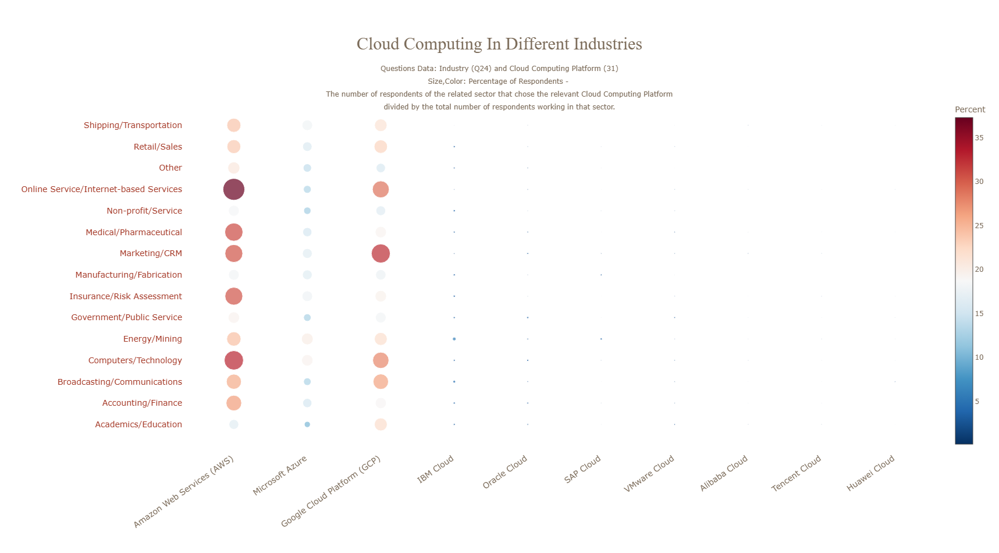

In [23]:
cloud_computing_platforms = [col for col in df.columns if col.startswith("Q31")]

dfs_list = []
for col in cloud_computing_platforms:
    dfs_list.append(
        scope_df.groupby(["Q24", col]).agg({"Q2" : "count"}).reset_index().rename(columns={col: "Q31", "Q2": "counts"})
    )

cloud_computing_platforms_df = pd.concat(dfs_list)
cloud_computing_platforms_df["relative_percent"] = cloud_computing_platforms_df.apply(lambda x : x["counts"] / industry_totals[x["Q24"]], axis = 1)
cloud_computing_platforms_df = cloud_computing_platforms_df[~cloud_computing_platforms_df["Q31"].isin(["None", "Other"])]


create_scatter_plot(
    cloud_computing_platforms_df["Q31"].apply(lambda x : x.split("/")[0]),
    cloud_computing_platforms_df["Q24"], 
     "Cloud Computing Platform: %{x}<br>" +
        "Industry: %{y}<br>" +
        "Percentage: %{marker.size:,}" +
        "<extra></extra>",
    cloud_computing_platforms_df['relative_percent']*100, 
    cloud_computing_platforms_df['relative_percent']*100, 
    "Cloud Computing In Different Industries",
    "Questions Data: Industry (Q24) and Cloud Computing Platform (31)",
    "Size,Color: Percentage of Respondents - <br>The number of respondents of the related sector that chose the relevant Cloud Computing Platform<br>divided by the total number of respondents working in that sector."
)

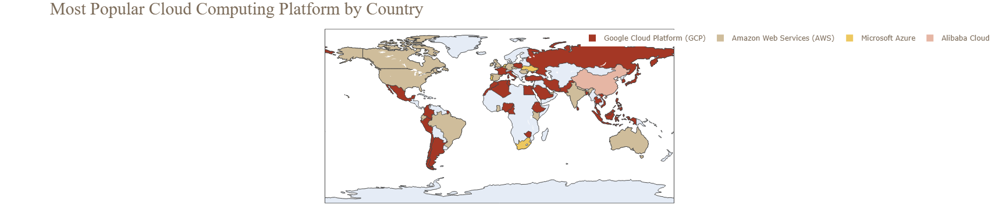

In [24]:
cloud_computing_questions = [col for col in scope_df.columns if col.startswith("Q31")]
country_totals = scope_df["Q4"].value_counts().to_dict()

dfs_list = []
for col in cloud_computing_questions:
    dfs_list.append(scope_df.groupby(["Q4", col]).agg({"Q2" : "count"}).reset_index().rename(columns={col: "Q31", "Q2": "counts"}))

cloud_computing_platforms = pd.concat(dfs_list)
cloud_computing_platforms["relative_percent"] = cloud_computing_platforms.apply(lambda x : x["counts"] / country_totals[x["Q4"]], axis = 1)
cloud_computing_platforms = cloud_computing_platforms[~cloud_computing_platforms["Q31"].isin(["None", "Other"])]

cloud_computing_platforms = cloud_computing_platforms.sort_values(by=["Q4", "counts"], ascending=True)
cloud_computing_platforms = cloud_computing_platforms.drop_duplicates(subset=["Q4"],keep='last')
cloud_computing_platforms["Q31"] = cloud_computing_platforms["Q31"].str.strip()


fig = px.choropleth(locations=cloud_computing_platforms['Q4'], 
                    locationmode="country names",
                    color=cloud_computing_platforms["Q31"] ,
                    color_discrete_map={'Google Cloud Platform (GCP)' : '#a43725',
                                        'Amazon Web Services (AWS)': '#cfbd9b',
                                        'Microsoft Azure': '#edc860',
                                        'Alibaba Cloud': '#E6b6a4'}
                   )

large_title_format = "<span style='font-size:30px; font-family:Times New Roman'>Most Popular Cloud Computing Platform by Country</span>"
small_title_format = "<span style='font-size:14px; font-family:Helvetica'></b></span>"


fig.update_layout(
    width=750,
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=0.9,
        xanchor="right",
        x=1, 
        title='',
    ),

    title = large_title_format + "<br>" + small_title_format,
    font = dict(color = '#7b6b59'),
    dragmode=False,
    margin = dict(
        l = 10,
        r = 10,
        b = 10,
        t = 50,
        pad = 0)
)

fig.show()

In [28]:
import json

products_questions = {
    "Q31": "Cloud Computing Platforms",
    "Q33": "Cloud Computing Products",
    "Q37": "ML Products",
    "Q34": "Data Storage Products",
    "Q35": "Data Products",
    "Q36": "BI Tools",
    "Q38": "Auto ML",
}

products_questions_colors = {
    "Q31": "#c07156",
    "Q33": "#cfbd9b",
    "Q37": "#edc860",
    "Q34": "#b39a74",
    "Q35": "#a43725",
    "Q36": "#beb29e",
    "Q38": "#e5b01c",
}

colors_plot = {}
count = 1
for product in products_questions_colors:
    colors_plot[products_questions[product]] = products_questions_colors[product]

    for col in [field for field in scope_df.columns if field.startswith(product)]:
        if col in scope_df.columns and "Q2" in scope_df.columns:
            grouped_df = scope_df.groupby([col])["Q2"].count().reset_index()

            if not grouped_df.empty:
                grouped_df.columns = ["Product / Technology", "counts"]  # Ensure correct column names
                tmp_name = grouped_df.iloc[0]["Product / Technology"].strip()

                if "none" in tmp_name.lower() or "other" in tmp_name.lower():
                    continue
                if tmp_name in colors_plot:
                    tmp_name = f"{tmp_name}_v{count}"
                    count += 1

                colors_plot[tmp_name] = products_questions_colors[product]

results = {"name": "flare", "children": [], "size": ""}

products = []
count = 0

for product in products_questions:
    category_data = {"name": products_questions[product], "children": [], "size": ""}

    for col in [field for field in scope_df.columns if field.startswith(product)]:
        if col in scope_df.columns and "Q2" in scope_df.columns:
            grouped_df = scope_df.groupby([col])["Q2"].count().reset_index()

            if not grouped_df.empty:
                grouped_df.columns = ["Product / Technology", "counts"]  # Rename columns
                tmp_name = grouped_df.iloc[0]["Product / Technology"].strip()
                tmp_counts = round((grouped_df.iloc[0]["counts"] / scope_df.shape[0]) * 100, 2)

                if "none" in tmp_name.lower() or "other" in tmp_name.lower():
                    continue
                if tmp_name in products:
                    count += 1
                    tmp_name = f"{tmp_name}_v{count}"
                else:
                    products.append(tmp_name)

                category_data["children"].append({"name": tmp_name, "size": tmp_counts})

    results["children"].append(category_data)
    
with open("output.json", "w") as outfile:
    json.dump(results, outfile, indent=4)
print("JSON file generated successfully!")


JSON file generated successfully!


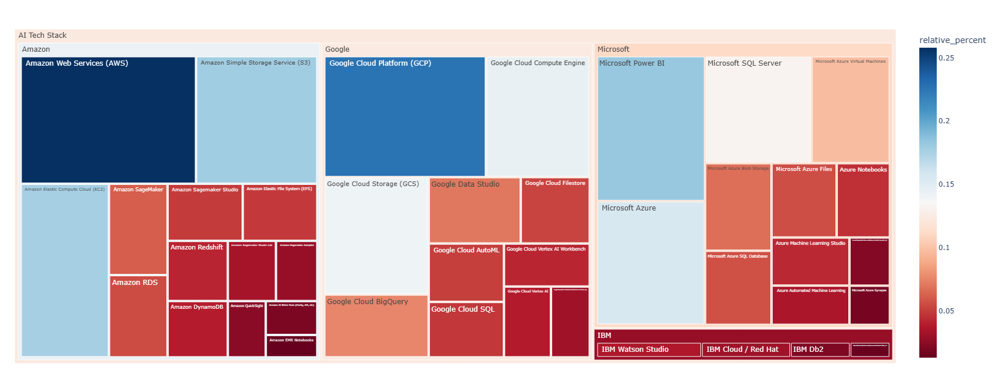

In [29]:
product_questions = ["Q14", "Q31", "Q33", "Q34", "Q35", "Q36","Q37", "Q38", "Q41"]

dfs_list = []
for product in product_questions:
    result = extract_and_count_all_the_multiple_choice_answers(product, scope_df)
    result = result.rename(columns={product: "Service"})
    dfs_list.append(result)

products_df = pd.concat(dfs_list)


products_df["Label"] = products_df["Service"].apply(lambda x : assign_label(x))

products_df = products_df[products_df["Label"].isin(["Amazon", "Microsoft", "Google", "IBM"])]

fig = px.treemap(products_df, path=[
    px.Constant("AI Tech Stack"),
    'Label',
    'Service'], values='counts', color = 'relative_percent', color_continuous_scale = 'RdBu', height = 650
                )
fig.update_traces(root_color="lightgrey")
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

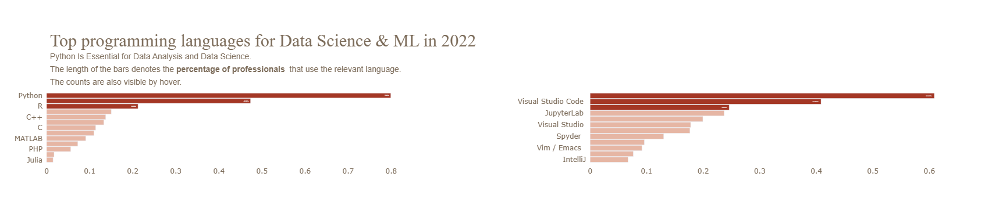

In [30]:
programming_languages =  extract_and_count_all_the_multiple_choice_answers("Q12", scope_df)
programming_languages = programming_languages[~programming_languages["Q12"].isin(["None", "Other"])]
ides =  extract_and_count_all_the_multiple_choice_answers("Q13", scope_df)
ides = ides[~ides["Q13"].isin(["None", "Other"])]

traces = dict()
trace_languages = get_bar_plot_trace(
    programming_languages["relative_percent"].to_list(), 
    programming_languages["Q12"].to_list(),
    np.round((programming_languages["relative_percent"] *100), decimals = 2),
    3, 
    programming_languages.shape[0]-3, 
    programming_languages["counts"].to_list()
) 


trace_ides = get_bar_plot_trace(
    ides["relative_percent"].to_list(),
    ides["Q13"].apply(lambda x : x.split("(")[0]),
    np.round((ides["relative_percent"] *100), decimals = 2),
    3, 
    ides.shape[0]-3, 
    ides["counts"].to_list()
) 

fig = make_subplots(
    rows=1, 
    cols=2 ,
    shared_yaxes=False, 
    shared_xaxes=True, 
    horizontal_spacing = 0.20, 
    vertical_spacing = 0.10,
)
traces["Programming_Languages"] = trace_languages
traces["ides"] = trace_ides



fig.append_trace(traces["Programming_Languages"],1,1)
fig.append_trace(traces["ides"],1,2)            


large_title_format = "<span style='font-size:30px; font-family:Times New Roman'>Top programming languages for Data Science & ML in 2022</span>"
small_title_format = "<span style='font-size:14px; font-family:Helvetica'>Python Is Essential for Data Analysis and Data Science.</br>The length of the bars denotes the <b>percentage of professionals </b> that use the relevant language.</br>The counts are also visible by hover.</span>"


layout = dict(
    title = large_title_format + "<br>" + small_title_format,
    font = dict(color = '#7b6b59'),
    showlegend = False,
    margin = dict(t=160,pad=6),
    plot_bgcolor='#fff',
    bargap = 0.10,
)

fig['layout'].update(layout)

fig.show()

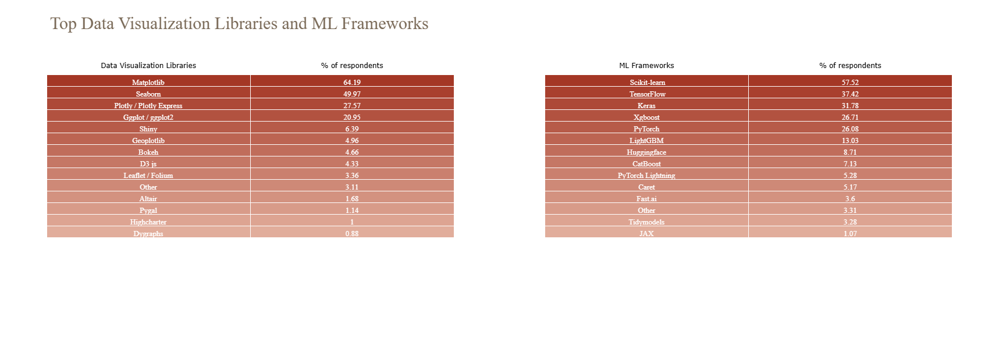

In [31]:
data_viz_libs = extract_and_count_all_the_multiple_choice_answers("Q15", scope_df)
data_viz_libs["relative_percent"] = round(data_viz_libs["relative_percent"] * 100,2)
data_viz_libs = data_viz_libs.rename(
    columns={"Q15":"Data Visualization Libraries", "counts": "# of respondents", "relative_percent": "% of respondents"}
)
data_viz_libs = data_viz_libs.sort_values(by=["% of respondents"], ascending=False).reset_index(drop=True)


ml_frameworks = extract_and_count_all_the_multiple_choice_answers("Q17", scope_df)
ml_frameworks["relative_percent"] = round(ml_frameworks["relative_percent"] * 100,2)
ml_frameworks = ml_frameworks.rename(
    columns={"Q17":"ML Frameworks", "counts": "# of respondents", "relative_percent": "% of respondents"}
)
ml_frameworks = ml_frameworks.sort_values(by=["% of respondents"], ascending=False).reset_index(drop=True)


colors = n_colors('rgb(230, 182, 164)', 'rgb(164, 55, 37)', 15, colortype='rgb')
a = [14,13,12,11,10,9,8,7,6,5,4,3,2,1,0]



fig = make_subplots(
    rows=1, cols=2,
    #shared_xaxes=True,
    vertical_spacing=0.03,
    specs=[[{"type": "table"}, {"type": "table"}],
          ]

)

fig.add_trace(
go.Table(
  header=dict(
    values=["Data Visualization Libraries", "% of respondents"],
    line_color='white', fill_color='white',
    align='center', font=dict(color='black', size=12)
  ),
  cells=dict(
    values=[data_viz_libs["Data Visualization Libraries"], data_viz_libs["% of respondents"]],
       
                            fill_color=[np.array(colors)[a]],
    align='center', font=dict(color='white', size=13, family='Arial Rounded MT Bold')
  )),
    row=1, col=1
)
fig.add_trace(
go.Table(
  header=dict(
    values=["ML Frameworks", "% of respondents"],
    line_color='white', fill_color='white',
    align='center', font=dict(color='black', size=12)
  ),
  cells=dict(
    values=[ml_frameworks["ML Frameworks"], ml_frameworks["% of respondents"]],
       
                            fill_color=[np.array(colors)[a]],
    align='center', font=dict(color='white', size=13, family='Arial Rounded MT Bold')
  )),
    row=1, col=2
)

large_title_format = "<span style='font-size:30px; font-family:Times New Roman'>Top Data Visualization Libraries and ML Frameworks</span>"
small_title_format = "<span style='font-size:14px; font-family:Helvetica'></b></span>"


fig.update_layout(
    height=600,
    font = dict(color = '#7b6b59'),
    showlegend=False,
    title = large_title_format + "<br>" + small_title_format,
)

fig.show()

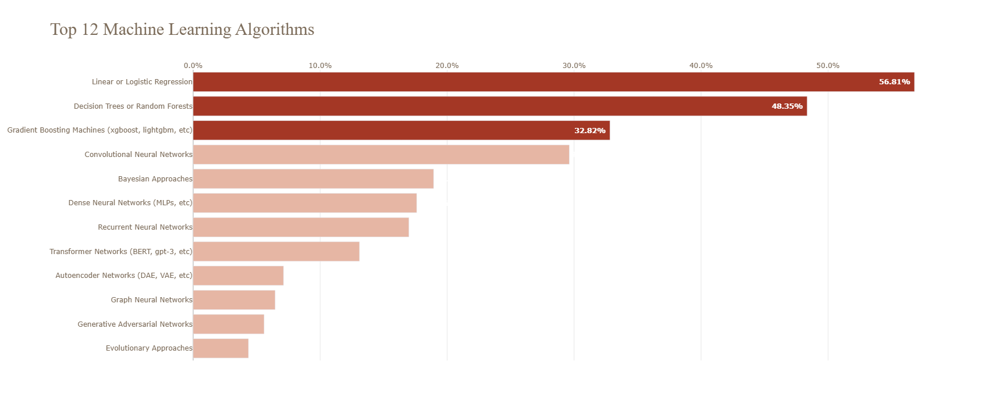

In [32]:
dfs_list = []

for col in [column for column in df.columns if column.startswith("Q18")]:
    dfs_list.append(scope_df.groupby([col]).agg({"Q2" : "count"}).reset_index().rename(columns={"Q2": "counts", col: "ML Algorithms"}))

ml_algorithms = pd.concat(dfs_list)
ml_algorithms["relative_percent"] = ml_algorithms.apply(lambda x : x["counts"] / scope_df.shape[0], axis = 1)


ml_algorithms = ml_algorithms.sort_values(by=["relative_percent"], ascending=True)
ml_algorithms = ml_algorithms[~ml_algorithms["ML Algorithms"].isin(["None", "Other"])]

create_single_bar_plot(
    x_values=ml_algorithms["relative_percent"].to_list(), 
    y_values=ml_algorithms["ML Algorithms"].to_list(),
    display_text=np.round((ml_algorithms["relative_percent"] *100), decimals = 2),
    top_n=3,
    rest_n=ml_algorithms.shape[0]-3, 
    hovertext = ml_algorithms["counts"].to_list(),
    title="Top 12 Machine Learning Algorithms",
    subtitle="", 
    orientation="h"
)

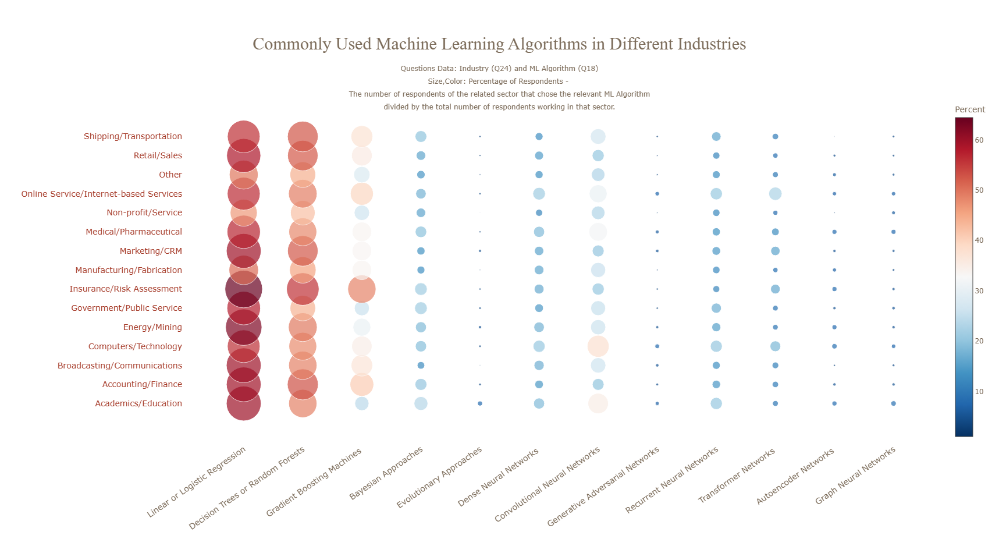

In [33]:
ml_algorithms = [col for col in df.columns if col.startswith("Q18")]

dfs_list = []
for col in ml_algorithms:
    dfs_list.append(
        scope_df.groupby(["Q24", col]).agg({"Q2" : "count"}).reset_index().rename(columns={col: "Q18", "Q2": "counts"})
    )

ml_algorithms_df = pd.concat(dfs_list)
ml_algorithms_df["relative_percent"] = ml_algorithms_df.apply(lambda x : x["counts"] / industry_totals[x["Q24"]], axis = 1)
ml_algorithms_df = ml_algorithms_df[~ml_algorithms_df["Q18"].isin(["None", "Other"])]


create_scatter_plot(
    ml_algorithms_df["Q18"].apply(lambda x : x.split("(")[0]),
    ml_algorithms_df["Q24"], 
     "ML Algorithm: %{x}<br>" +
        "Industry: %{y}<br>" +
        "Percentage: %{marker.size:,}" +
        "<extra></extra>",
    ml_algorithms_df['relative_percent']*100, 
    ml_algorithms_df['relative_percent']*100, 
    "Commonly Used Machine Learning Algorithms in Different Industries",
    "Questions Data: Industry (Q24) and ML Algorithm (Q18)",
    "Size,Color: Percentage of Respondents - <br>The number of respondents of the related sector that chose the relevant ML Algorithm<br>divided by the total number of respondents working in that sector."
)

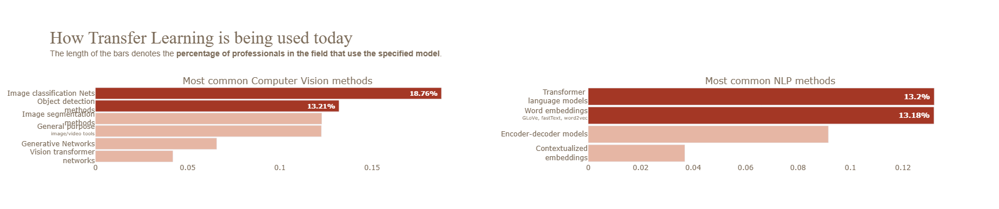

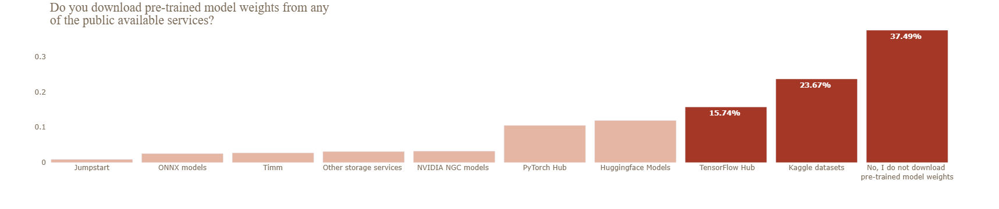

In [34]:
map_cv_methods = {
    "Vision transformer networks (ViT, DeiT, BiT, BEiT, Swin, etc)": "Vision transformer<br>networks" , 
    "Generative Networks (GAN, VAE, etc)": "Generative Networks",
    "General purpose image/video tools (PIL, cv2, skimage, etc)": "General purpose<br><sup>image/video tools</sup>", 
    "Object detection methods (YOLOv6, RetinaNet, etc)": "Object detection<br>methods",
    "Image classification and other general purpose networks (VGG, Inception, ResNet, ResNeXt, NASNet, EfficientNet, etc)": "Image classification Nets",
    "Image segmentation methods (U-Net, Mask R-CNN, etc)": "Image segmentation<br>methods"
}

map_nlp_methods = {
    "Contextualized embeddings (ELMo, CoVe)": "Contextualized<br>embeddings" , 
    "Encoder-decoder models (seq2seq, vanilla transformers)": "Encoder-decoder models",
    "Word embeddings/vectors (GLoVe, fastText, word2vec)": "Word embeddings<br><sup>GLoVe, fastText, word2vec</sup>", 
    "Transformer language models (GPT-3, BERT, XLnet, etc)": "Transformer <br>language models",

}

computer_vision_methods =  extract_and_count_all_the_multiple_choice_answers("Q19", scope_df)
computer_vision_methods = computer_vision_methods[~computer_vision_methods["Q19"].isin(["None", "Other"])]
computer_vision_methods["Q19"] = computer_vision_methods["Q19"].apply(lambda x : map_cv_methods[x])

nlp_methods = extract_and_count_all_the_multiple_choice_answers("Q20", scope_df)
nlp_methods = nlp_methods[~nlp_methods["Q20"].isin(["None", "Other"])]
nlp_methods["Q20"] = nlp_methods["Q20"].apply(lambda x : map_nlp_methods[x])


pre_trained_models =  extract_and_count_all_the_multiple_choice_answers("Q21", scope_df)
pre_trained_models["Q21"] = np.where(pre_trained_models["Q21"] == "No, I do not download pre-trained model weights on a regular basis", "No, I do not download <br>pre-trained model weights", pre_trained_models["Q21"])


traces = dict()

trace_nlp = get_bar_plot_trace(
    nlp_methods["relative_percent"].to_list(),
    nlp_methods["Q20"].to_list(),
    np.round((nlp_methods["relative_percent"] *100), decimals = 2),
    2, 
    nlp_methods.shape[0]-2, 
    nlp_methods["counts"].to_list()
) 


trace_cv = get_bar_plot_trace(
    computer_vision_methods["relative_percent"].to_list(),
    computer_vision_methods["Q19"].to_list(),
    np.round((computer_vision_methods["relative_percent"] *100), decimals = 2),
    2, 
    computer_vision_methods.shape[0]-2, 
    computer_vision_methods["counts"].to_list()
) 


trace_models = get_bar_plot_trace(
    pre_trained_models["Q21"].apply(lambda x : x.split("(")[0]).to_list(),
    pre_trained_models["relative_percent"].to_list(),
    np.round((pre_trained_models["relative_percent"] *100), decimals = 2),
    3, 
    pre_trained_models.shape[0]-3, 
    pre_trained_models["counts"].to_list(),
    orientation = "v"
) 

traces["NLP_methods"] = trace_nlp
traces["CV_methods"] = trace_cv


fig = make_subplots(
    rows=1, 
    cols=2 ,
    shared_yaxes=False, 
    shared_xaxes=True, 
    horizontal_spacing = 0.15, 
    subplot_titles=("Most common Computer Vision methods", "Most common NLP methods", "Do you download Pre-Trained Models for Transfer Learning?"))


fig.append_trace(traces["CV_methods"],1,1)
fig.append_trace(traces["NLP_methods"],1,2)            

large_title_format = "<span style='font-size:30px; font-family:Times New Roman'>How Transfer Learning is being used today</span>"
small_title_format = "<span style='font-size:14px; font-family:Helvetica'>The length of the bars denotes the <b>percentage of professionals in the field that use the specified model</b>.</span>"


layout = dict(
    title = large_title_format + "<br>" + small_title_format + "<br><br>",
    showlegend = False,
    font = dict(color = '#7b6b59'),
    margin = dict(t=150),
    plot_bgcolor='#fff',
    bargap = 0.10,

)


fig['layout'].update(layout)

fig.show()

large_title_format = "<span style='font-size:22px; font-family:Times New Roman'>Do you download pre-trained model weights from any <br>of the public available services? </span>"


fig = go.Figure(trace_models)
layout = dict(
    title = large_title_format + "<br>",
    showlegend = False,
    font = dict(color = '#7b6b59'),
    margin = dict(t=40),
    plot_bgcolor='#fff',
    bargap = 0.10,

)


fig['layout'].update(layout)

fig.show()

In [35]:
nlp_usage = scope_df.groupby(
    ["NLP_methods_usage"]
).agg({
    "Q2" : "count"
}).reset_index().rename(columns={
    "Q2": "Nbr of respondents",
    "NLP_methods_usage": "Use of NLP Methods and Pre-trained Models"
})
nlp_usage["%"] = np.round((nlp_usage["Nbr of respondents"] / scope_df.shape[0]) * 100, 2)
nlp_usage.style.background_gradient(axis=0,  cmap='Blues')

,Use of NLP Methods and Pre-trained Models,Nbr of respondents,%
0,No,7399,81.360000
1,Yes,1695,18.640000


In [36]:
roles_totals = scope_df["Q23"].value_counts().to_dict()

nlp_usage = scope_df[scope_df["NLP_methods_usage"] == "Yes"].groupby(["Q23"]).agg({"Q2" : "count"}).reset_index().rename(columns={"Q2": "Nbr of respondents", "Q23" : "Role"})

nlp_usage["%"] = nlp_usage.apply(lambda x : x["Nbr of respondents"] / roles_totals[x["Role"]], axis = 1)
nlp_usage["%"]  = np.round(nlp_usage["%"] * 100, 2)
nlp_usage = nlp_usage.sort_values(by=["%"], ascending=False).reset_index(drop=True)

nlp_usage.style.background_gradient(axis=0,  cmap='Oranges')

,Role,Nbr of respondents,%
0,Machine Learning/ MLops Engineer,251,44.660000
1,Data Scientist,582,30.420000
2,Developer Advocate,17,28.810000
3,Research Scientist,143,24.240000
4,Data Architect,20,21.050000
5,Data Engineer,57,16.720000
6,Software Engineer,157,16.170000
7,"Manager (Program, Project, Operations, Executive-level, etc)",132,15.980000
8,Teacher / professor,120,14.630000
9,Statistician,12,9.760000


In [37]:
cv_usage = scope_df.groupby(
    ["CV_methods_usage"]
).agg({
    "Q2" : "count"
}).reset_index().rename(columns={
    "Q2": "Nbr of respondents",
    "CV_methods_usage": "Use of CV Methods and Pre-trained Models"
})
cv_usage["%"] = np.round((cv_usage["Nbr of respondents"] / scope_df.shape[0]) * 100, 2)
cv_usage.style.background_gradient(axis=0,  cmap='Blues')

,Use of CV Methods and Pre-trained Models,Nbr of respondents,%
0,No,6705,73.730000
1,Yes,2389,26.270000


In [38]:
roles_totals = scope_df["Q23"].value_counts().to_dict()

cv_usage = scope_df[scope_df["CV_methods_usage"] == "Yes"].groupby(["Q23"]).agg({"Q2" : "count"}).reset_index().rename(columns={"Q2": "Nbr of respondents", "Q23" : "Role"})

cv_usage["%"] = cv_usage.apply(lambda x : x["Nbr of respondents"] / roles_totals[x["Role"]], axis = 1)
cv_usage["%"]  = np.round(cv_usage["%"] * 100, 2)
cv_usage = cv_usage.sort_values(by=["%"], ascending=False).reset_index(drop=True)

cv_usage.style.background_gradient(axis=0,  cmap='Oranges')

,Role,Nbr of respondents,%
0,Machine Learning/ MLops Engineer,339,60.320000
1,Research Scientist,241,40.850000
2,Developer Advocate,22,37.290000
3,Data Scientist,613,32.040000
4,Data Architect,30,31.580000
5,Teacher / professor,242,29.510000
6,Software Engineer,283,29.150000
7,Data Engineer,90,26.390000
8,"Manager (Program, Project, Operations, Executive-level, etc)",194,23.490000
9,Engineer (non-software),73,15.770000


In [39]:
hardware_usage = scope_df.groupby(
    ["GPU_usage"]
).agg({
    "Q2" : "count"
}).reset_index().rename(columns={
    "Q2": "Nbr of respondents",
    "GPU_usage": "Specialized Hardware Usage"
})
hardware_usage["%"] = np.round((hardware_usage["Nbr of respondents"] / scope_df.shape[0]) * 100, 2)
hardware_usage.style.background_gradient(axis=0,  cmap='Blues')

,Specialized Hardware Usage,Nbr of respondents,%
0,No,6263,68.870000
1,Yes,2831,31.130000


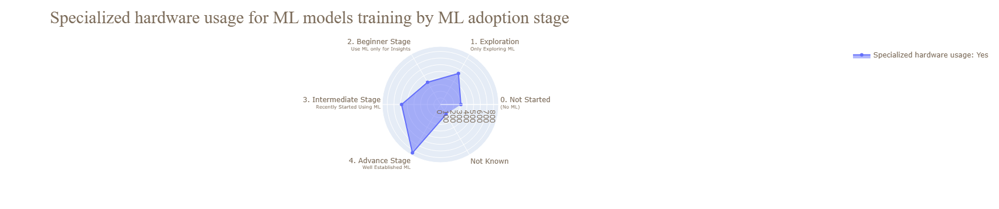

In [40]:
usage_per_adoption = scope_df.groupby(
    ["ML_adoption", "GPU_usage"]
).agg({
    "Q2" : "count"
}).reset_index().rename(columns={
    "Q2": "counts"
})
usage_per_adoption

fig = go.Figure()

fig.add_trace(go.Scatterpolar(
      r=usage_per_adoption[usage_per_adoption["GPU_usage"] == "Yes"].sort_values(by=["ML_adoption"])["counts"].to_list(),
      theta=usage_per_adoption[usage_per_adoption["GPU_usage"] == "Yes"].sort_values(by=["ML_adoption"])["ML_adoption"].to_list(),
      fill='toself',
      name='Specialized hardware usage: Yes'
))

large_title_format = "<span style='font-size:30px; font-family:Times New Roman'>Specialized hardware usage for ML models training by ML adoption stage</span>"
small_title_format = "<span style='font-size:14px; font-family:Helvetica'></b></span>"


layout = dict(
    title = large_title_format + "<br>" + small_title_format,
    font = dict(color = '#7b6b59'),
    showlegend = True,
    margin = dict(t=80,pad=6),

)
fig["layout"].update(layout)

fig.show()

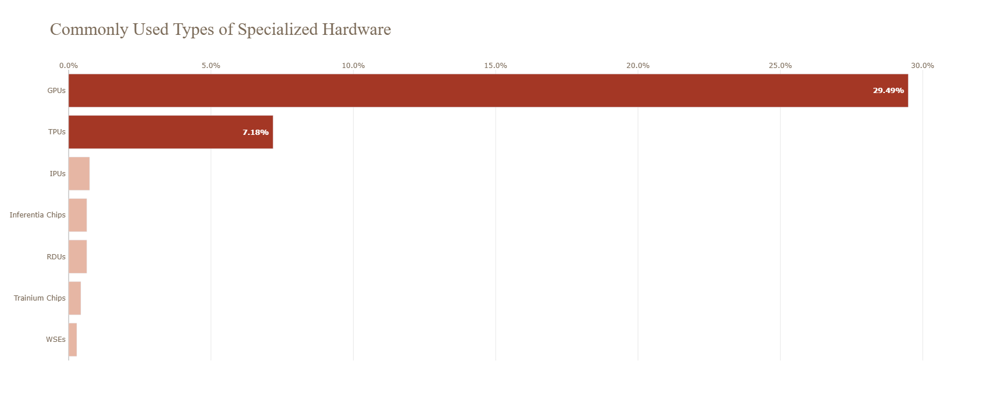

In [41]:
dfs_list = []

for col in [column for column in df.columns if column.startswith("Q42")]:
    dfs_list.append(scope_df.groupby([col]).agg({"Q2" : "count"}).reset_index().rename(columns={"Q2": "counts", col: "Hardware"}))

hardware = pd.concat(dfs_list)
hardware["relative_percent"] = hardware.apply(lambda x : x["counts"] / scope_df.shape[0], axis = 1)


hardware = hardware.sort_values(by=["relative_percent"], ascending=True)
hardware = hardware[~hardware["Hardware"].isin(["None", "Other"])]

create_single_bar_plot(
    x_values=hardware["relative_percent"].to_list(), 
    y_values=hardware["Hardware"].to_list(),
    display_text=np.round((hardware["relative_percent"] *100), decimals = 2),
    top_n=2,
    rest_n=hardware.shape[0]-2, 
    hovertext = hardware["counts"].to_list(),
    title="Commonly Used Types of Specialized Hardware",
    subtitle="", 
    orientation="h"
)

In [42]:
roles_totals = scope_df["Q23"].value_counts().to_dict()

gpu_usage = scope_df[scope_df["GPU_usage"] == "Yes"].groupby(["Q23"]).agg({"Q2" : "count"}).reset_index().rename(columns={"Q2": "Nbr of respondents", "Q23" : "Role"})

gpu_usage["%"] = gpu_usage.apply(lambda x : x["Nbr of respondents"] / roles_totals[x["Role"]], axis = 1)
gpu_usage["%"]  = np.round(gpu_usage["%"] * 100, 2)
gpu_usage = gpu_usage.sort_values(by=["%"], ascending=False).reset_index(drop=True)

gpu_usage.style.background_gradient(axis=0,  cmap='Oranges')


,Role,Nbr of respondents,%
0,Machine Learning/ MLops Engineer,352,62.630000
1,Data Scientist,811,42.390000
2,Research Scientist,242,41.020000
3,Data Engineer,119,34.900000
4,Data Architect,33,34.740000
5,"Manager (Program, Project, Operations, Executive-level, etc)",277,33.540000
6,Software Engineer,291,29.970000
7,Developer Advocate,16,27.120000
8,Teacher / professor,203,24.760000
9,Engineer (non-software),85,18.360000


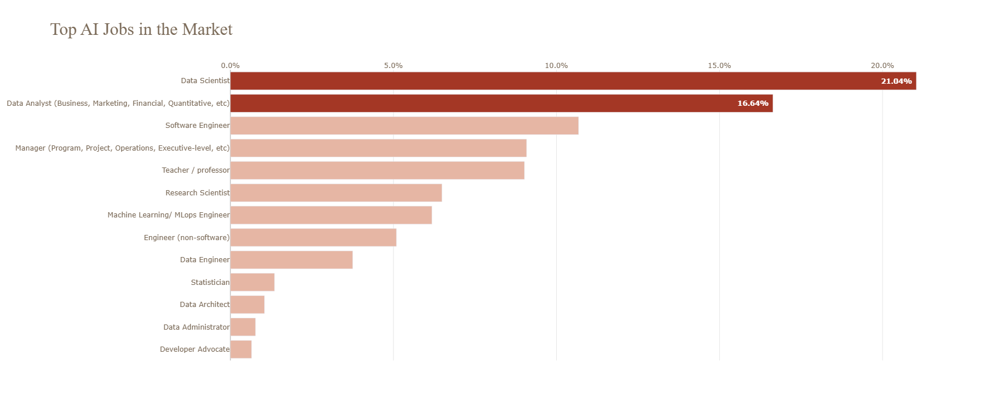

In [43]:
data_science_roles = scope_df.groupby(["Q23"]).agg({"Q2" : "count"}).reset_index().rename(columns={"Q2": "counts"})

data_science_roles["relative_percent"] = data_science_roles.apply(lambda x : (x["counts"] / scope_df.shape[0]), axis = 1)
data_science_roles = data_science_roles.sort_values(by=["relative_percent"], ascending=True)
data_science_roles = data_science_roles[~data_science_roles["Q23"].isin(["None", "Other"])]


create_single_bar_plot(
    x_values=data_science_roles["relative_percent"].to_list(),
    y_values=data_science_roles["Q23"].to_list(),
    display_text=np.round((data_science_roles["relative_percent"] *100), decimals = 2),
    top_n=2,
    rest_n=data_science_roles.shape[0]-2, 
    hovertext = data_science_roles["counts"].to_list(),
    title="Top AI Jobs in the Market",
    subtitle="", 
    orientation="h"
)

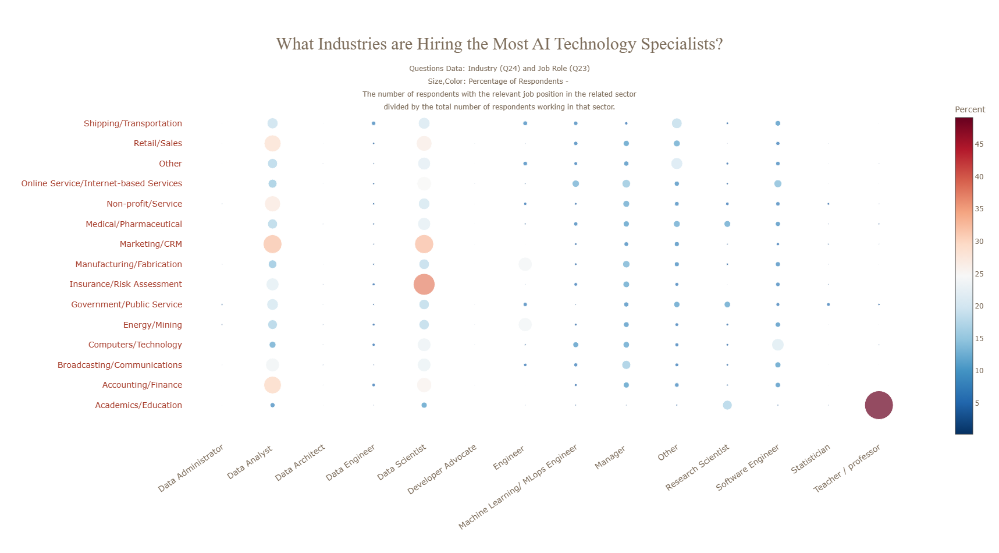

In [44]:
roles_df = scope_df.groupby(["Q24", "Q23"]).agg({"Q2" : "count"}).reset_index().rename(columns={"Q2": "counts"})
roles_df["relative_percent"] = roles_df.apply(lambda x : x["counts"] / industry_totals[x["Q24"]], axis = 1)

create_scatter_plot(
    roles_df["Q23"].apply(lambda x : x.split("(")[0]),
    roles_df["Q24"], 
     "Role: %{x}<br>" +
        "Industry: %{y}<br>" +
        "Percentage: %{marker.size:,}" +
        "<extra></extra>",
    roles_df['relative_percent']*100, 
    roles_df['relative_percent']*100, 
    "What Industries are Hiring the Most AI Technology Specialists?",
    "Questions Data: Industry (Q24) and Job Role (Q23)",
    "Size,Color: Percentage of Respondents - <br>The number of respondents with the relevant job position in the related sector<br>divided by the total number of respondents working in that sector."
)


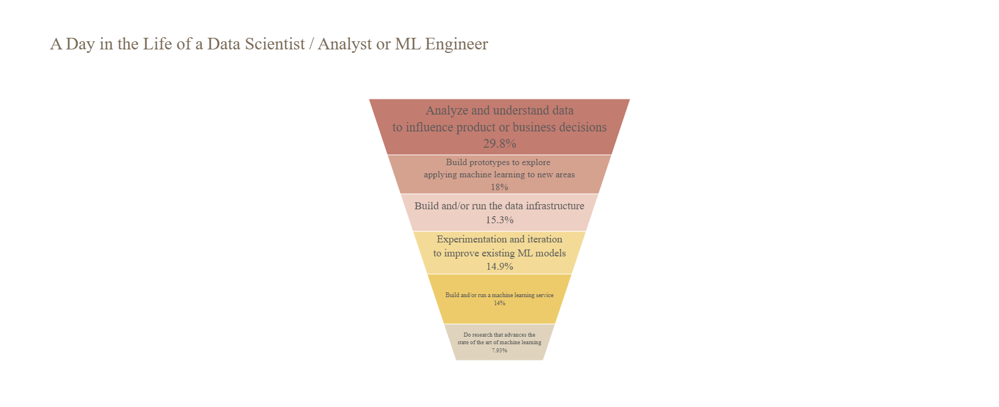

In [45]:
dfs_list = []
ml_scope_df = scope_df[
    (scope_df["Q23"].isin(["Machine Learning/ MLops Engineer", "Data Scientist"])) |
    (scope_df["Q23"].str.contains("Data Analyst"))
]

for col in [column for column in df.columns if column.startswith("Q28")]:
    dfs_list.append(ml_scope_df.groupby([col]).agg({"Q2" : "count"}).reset_index().rename(columns={"Q2": "counts", col: "ML Activities"}))
    
ml_activities = pd.concat(dfs_list)
ml_activities["relative_percent"] = ml_activities.apply(lambda x : x["counts"] / ml_activities["counts"].sum(), axis = 1)


ml_activities = ml_activities.sort_values(by=["relative_percent"], ascending=False)
ml_activities = ml_activities[
    ~((ml_activities["ML Activities"].str.contains("None")) | 
    (ml_activities["ML Activities"].str.contains("Other")))
]


map_ml_activities = {
    "Analyze and understand data to influence product or business decisions": "Analyze and understand data<br>to influence product or business decisions" , 
    "Build prototypes to explore applying machine learning to new areas": "Build prototypes to explore <br>applying machine learning to new areas",
    "Build and/or run the data infrastructure that my business uses for storing, analyzing, and operationalizing data": "Build and/or run the data infrastructure", 
    "Experimentation and iteration to improve existing ML models": "Experimentation and iteration<br>to improve existing ML models",
    "Build and/or run a machine learning service that operationally improves my product or workflows": "Build and/or run a machine learning service",
    "Do research that advances the state of the art of machine learning": "Do research that advances the<br>state of the art of machine learning"

}
ml_activities["ML Activities"] = ml_activities["ML Activities"].apply(lambda x : map_ml_activities[x])

fig = go.Figure(go.Funnelarea(
      values = ml_activities["counts"].to_list(), text = ml_activities["ML Activities"].to_list(),
      marker = {"colors": ["#a43725","#c07156", "#E6b6a4", "#edc860", "#e5b01c", "#cfbd9b", "#a43725"],
              },
      textfont = {"family": "Times New Roman", "size": 22, "color": "black"}, opacity = 0.65))

large_title_format = "<span style='font-size:30px; font-family:Times New Roman'>A Day in the Life of a Data Scientist / Analyst or ML Engineer</span>"


layout = dict(
    title = large_title_format,
    font = dict(color = '#7b6b59'),
    margin = dict(t=170),
    width = 800,
    height= 700,
    plot_bgcolor = "white"
)

fig.update_layout(layout)
fig.update_traces(showlegend=False)
fig.show()

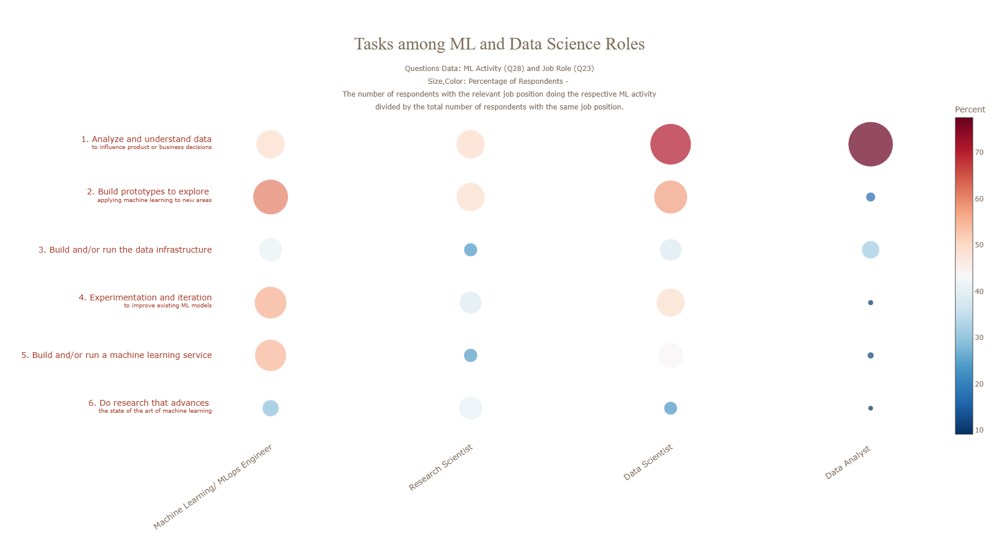

In [46]:
jobs_in_scope = [
    "Data Scientist",
    "Data Analyst (Business, Marketing, Financial, Quantitative, etc)",
    "Research Scientist",
    "Machine Learning/ MLops Engineer"
]
activities = [col for col in df.columns if col.startswith("Q28")]
job_roles = scope_df["Q23"].str.strip().value_counts().to_dict()
dfs_list = []
for role in jobs_in_scope:
    for col in activities:
        roles_df = scope_df[
            scope_df["Q23"].str.strip() == role
        ].groupby(["Q23", col]).agg({"Q2" : "count"}).reset_index().rename(columns={"Q2": "counts", col: "ML Activities"})
        dfs_list.append(roles_df)

results = pd.concat(dfs_list)

results["Q23"] = results["Q23"].str.strip()
results["relative_percent"] = results.apply(lambda x : x["counts"] / job_roles[x["Q23"]], axis = 1)
results = results[
    ~((results["ML Activities"].str.contains("None")) | 
    (results["ML Activities"].str.contains("Other")))
]


map_ml_activities = {
    "Analyze and understand data to influence product or business decisions": "1. Analyze and understand data<br><sup>to influence product or business decisions</sup>" , 
    "Build prototypes to explore applying machine learning to new areas": "2. Build prototypes to explore <br><sup>applying machine learning to new areas</sup>",
    "Build and/or run the data infrastructure that my business uses for storing, analyzing, and operationalizing data": "3. Build and/or run the data infrastructure</sup>", 
    "Experimentation and iteration to improve existing ML models": "4. Experimentation and iteration<br><sup>to improve existing ML models</sup>",
    "Build and/or run a machine learning service that operationally improves my product or workflows": "5. Build and/or run a machine learning service",
    "Do research that advances the state of the art of machine learning": "6. Do research that advances <br><sup>the state of the art of machine learning</sup>"

}
results["ML Activities"] = results["ML Activities"].apply(lambda x : map_ml_activities[x])

results = results.sort_values(by=["ML Activities"], ascending=False)


create_scatter_plot(
    results["Q23"].apply(lambda x : x.split("(")[0]).to_list(), 
    results["ML Activities"].apply(lambda x : x.split("(")[0]),
     "Role: %{x}<br>" +
        "ML Activity: %{y}<br>" +
        "Percentage: %{marker.size:,}" +
        "<extra></extra>",
    results['relative_percent']*100, 
    results['relative_percent']*100, 
    "Tasks among ML and Data Science Roles",
    "Questions Data: ML Activity (Q28) and Job Role (Q23)",
    "Size,Color: Percentage of Respondents - <br>The number of respondents with the relevant job position doing the respective ML activity<br>divided by the total number of respondents with the same job position."
)


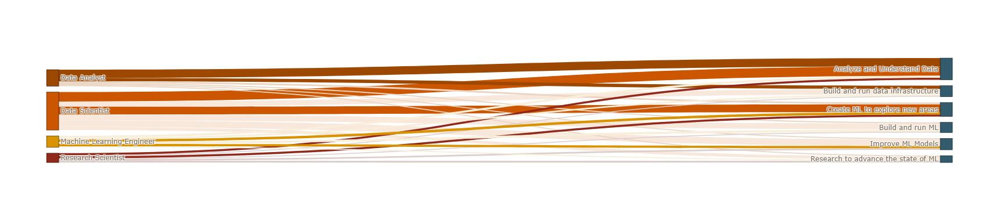

In [47]:
jobs_in_scope = [
    "Data Scientist",
    "Data Analyst (Business, Marketing, Financial, Quantitative, etc)",
    "Research Scientist",
    "Machine Learning/ MLops Engineer"
]

tasks_in_scope = [
    "Q28_1",
    "Q28_2",
    "Q28_3",
    "Q28_4",
    "Q28_5",
    "Q28_6",
]

label = [
    "Data Scientist", #0
    "Data Analyst", #1
    "Research Scientist", #2
    "Machine Learning Engineer", #3
    'Analyze and Understand Data', #4
    'Build and run data infrastructure', #5
    'Create ML to explore new areas', #6
    'Build and run ML',  #7
    'Improve ML Models', #8
    'Research to advance the state of ML' #9
    
]

source = [0,0,0,0,0,0, 1,1,1,1,1,1,   2,2,2,2,2,2, 3,3,3,3,3,3]
target = [4,5,6,7,8,9,  4,5,6,7,8,9, 4,5,6,7,8,9, 4,5,6,7,8,9,]
value = []
for job in jobs_in_scope:
    for col in tasks_in_scope:

        value.append(scope_df[scope_df["Q23"] == job ][col].count())
        

color_node = [
    "#CC5600", 
    "#9D4800", 
    "#91281A", 
    "#DA9300",
    "#325C6E",
    "#325C6E",
    "#325C6E",
    "#325C6E", 
    "#325C6E", 
    "#325C6E",
    "#325C6E"
]

color_link = ["#F8E8DC","#CC5600", "#F8E8DC", "#F8E8DC", "#CC5600",
              "#EBD5C3","#EBD5C3", "#9D4800", "#EBD5C3", "#9D4800",
              "#DDCECC", "#DDCECC", "#91281A", "#DDCECC", "#91281A",
              "#F8EED9", "#DA9300", "#F8EED9", "#F8EED9", "#DA9300"]


color_link = ["#CC5600", "#F8E8DC", "#CC5600", "#F8E8DC", "#F8E8DC", "#F8E8DC",
              "#9D4800", "#9D4800", "#EBD5C3", "#EBD5C3","#EBD5C3","#EBD5C3", 
              "#91281A", "#DDCECC", "#91281A", "#DDCECC", "#DDCECC", "#DDCECC",
              "#F8EED9", "#F8EED9", "#DA9300", "#F8EED9", "#DA9300", "#F8EED9",
            ]

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 10,
      thickness = 21,
      line = dict(color = "black", width = 0.5),
      label = label,
      color=color_node,
        
        
    ),
    link = dict(
      source = source, # indices correspond to labels, eg A1, A2, A1, B1, ...
      target = target,
      value = value,
        color = color_link
  ), arrangement='snap')])


large_title_format = "<span style='font-size:30px; font-family:Times New Roman'>Tasks among ML and Data Science Roles</span>"

layout = dict(
    #title = large_title_format,
    font = dict(color = '#7b6b59'),

)

fig.update_layout(layout)
fig.show()

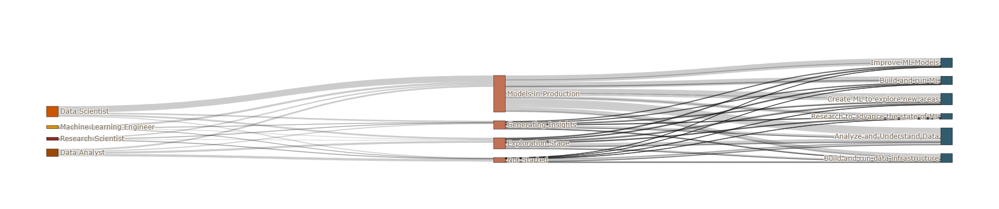

In [48]:
jobs_in_scope = [
    "Data Scientist",
    "Data Analyst (Business, Marketing, Financial, Quantitative, etc)",
    "Research Scientist",
    "Machine Learning/ MLops Engineer"
]

models_in_scope = [
    "Models in Production",
    "Not Started",
    "Exploration Stage",
    "Generating Insights"

]
tasks_in_scope = [
    "Q28_1",
    "Q28_2",
    "Q28_3",
    "Q28_4",
    "Q28_5",
    "Q28_6",
]

label = [
    "Data Scientist", #0
    "Data Analyst", #1
    "Research Scientist", #2
    "Machine Learning Engineer", #3
    "Models in Production", #4
    "Not Started", #5
    "Exploration Stage", #6
    "Generating Insights", #7
    'Analyze and Understand Data', #8
    'Build and run data infrastructure', #9
    'Create ML to explore new areas', #10
    'Build and run ML', #11
    'Improve ML Models', #12 
    'Research to advance the state of ML' #13
    
]
source = [0, 0, 0, 0, 4,4,4,4,4,4, 5,5,5,5,5,5, 6,6,6,6,6,6, 7,7,7,7,7,7,  
         1, 1, 1, 1, 4,4,4,4,4,4, 5,5,5,5,5,5, 6,6,6,6,6,6, 7,7,7,7,7,7,
            2, 2, 2, 2, 4,4,4,4,4,4, 5,5,5,5,5,5, 6,6,6,6,6,6, 7,7,7,7,7,7,
          3,3,3,3, 4,4,4,4,4,4, 5,5,5,5,5,5, 6,6,6,6,6,6, 7,7,7,7,7,7,
         ]
target = [4, 5, 6, 7,  8,9,10,11,12,13, 8,9,10,11,12,13, 8,9,10,11,12,13, 8,9,10,11,12,13, 
          4, 5, 6, 7,  8,9,10,11,12,13, 8,9,10,11,12,13, 8,9,10,11,12,13, 8,9,10,11,12,13, 
          4, 5, 6, 7,  8,9,10,11,12,13, 8,9,10,11,12,13, 8,9,10,11,12,13, 8,9,10,11,12,13, 
          4, 5, 6, 7,  8,9,10,11,12,13, 8,9,10,11,12,13, 8,9,10,11,12,13, 8,9,10,11,12,13, ]
value = []
for job in jobs_in_scope:
    for model in models_in_scope:
        value.append(
            scope_df[
                (scope_df["Q23"] == job) &
                (scope_df["ML_adoption_class"] == model)
            ].shape[0])
    for model in models_in_scope:
        for col in tasks_in_scope:
        
            value.append(
               scope_df[
                (scope_df["Q23"] == job) &
                (scope_df["ML_adoption_class"] == model)
            ][col].count())
        

        

color_node = ["#CC5600", "#9D4800",  "#91281A", "#DA9300"] + ["#c07156"]*4 + ["#325C6E"]*6 


color_link = ["#DDCECC"]*4 + ["#89CFF0"]*24 +["#DA9300"]*4 +["pink"]*24 + ["#FAC898"] * 4 + ["pink"]*24 + ["#F8EED9"] * 4 + ["pink"]*24 
 
fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = label,
     color=color_node,
        
        
    ),
    link = dict(
      source = source, # indices correspond to labels, eg A1, A2, A1, B1, ...
      target = target,
      value = value,
       # color = color_link
  ))])



large_title_format = "<span style='font-size:30px; font-family:Times New Roman'>Tasks among ML and Data Science Roles</span>"

layout = dict(
    
    font = dict(color = '#7b6b59'),

)

fig.update_layout(layout)
fig.show()

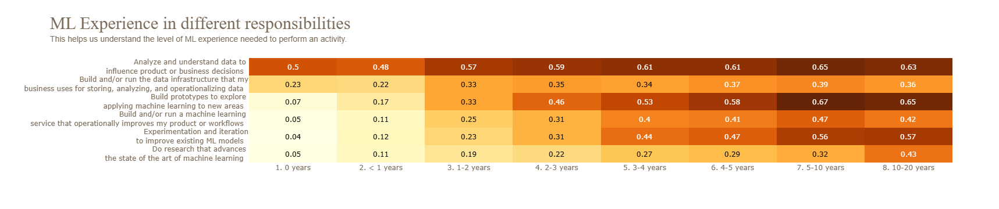

In [49]:
years_ml_in_scope = list(map_ml_experience.values())[0:-1]
years_ml_in_scope = years_ml_in_scope[0:-1]

ml_activities = [col for col in scope_df.columns if col.startswith("Q28")]
# Exclude None and others
ml_activities = ml_activities[:-2]

ml_activities.reverse()
x = years_ml_in_scope
y = ['Do research that advances <br> the state of the art of machine learning',
 'Experimentation and iteration<br> to improve existing ML models',
 'Build and/or run a machine learning <br>service that operationally improves my product or workflows',
 'Build prototypes to explore <br>applying machine learning to new areas',
 'Build and/or run the data infrastructure that my<br> business uses for storing, analyzing, and operationalizing data',
 'Analyze and understand data to <br>influence product or business decisions']

z = []

for activity in ml_activities:
    tmp = []
    for years in years_ml_in_scope:
        tmp.append(round((scope_df[scope_df["Q16"] == years][activity].count() / scope_df[scope_df["Q16"] == years].shape[0]),2)) 
    z.append(tmp)

create_heatmap(z, x, y, z, "YlOrBr", "ML Experience in different responsibilities", subtitle="This helps us understand the level of ML experience needed to perform an activity.")

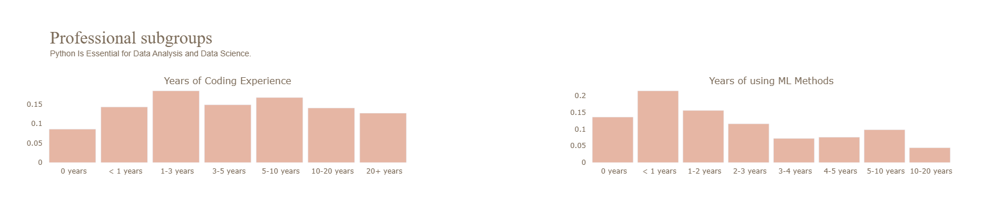

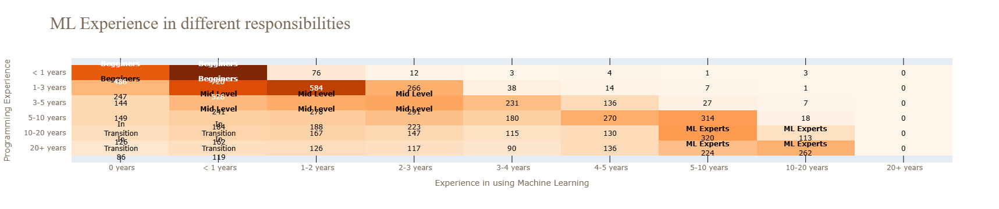

In [50]:
programming_experience_df = scope_df.groupby(["Q11"]).agg({"Q2" : "count"}).reset_index().rename(columns={"Q2": "counts"})
programming_experience_df["relative_percent"] = programming_experience_df.apply(lambda x : x["counts"] / scope_df.shape[0], axis = 1)
programming_experience_df = programming_experience_df.sort_values(by=["Q11"])
programming_experience_df["Q11"] = programming_experience_df["Q11"].apply(lambda x : x.split(".")[-1])


ml_experience_df = scope_df.groupby(["Q16"]).agg({"Q2" : "count"}).reset_index().rename(columns={"Q2": "counts"})
ml_experience_df["relative_percent"] = ml_experience_df.apply(lambda x : x["counts"] / scope_df.shape[0], axis = 1)
ml_experience_df = ml_experience_df.sort_values(by=["Q16"])
ml_experience_df["Q16"] = ml_experience_df["Q16"].apply(lambda x : x.split(".")[-1])


traces = dict()

trace_experience_coding = get_bar_plot_trace(
    programming_experience_df["Q11"].to_list(),
    programming_experience_df["relative_percent"].to_list(),
    np.round((programming_experience_df["relative_percent"] *100), decimals = 2),
    0, 
    programming_experience_df.shape[0]-0, 
    programming_experience_df["counts"].to_list(),
    orientation="v"
) 

trace_experience_ml = get_bar_plot_trace(
    ml_experience_df["Q16"].apply(lambda x : x.split("(")[0]),
    ml_experience_df["relative_percent"].to_list(),
    np.round((ml_experience_df["relative_percent"] *100), decimals = 2),
    0, 
    ml_experience_df.shape[0]-0, 
    ml_experience_df["counts"].to_list(),
    orientation="v"
) 



fig = make_subplots(
    rows=1, 
    cols=2 ,
    shared_yaxes=False, 
    shared_xaxes=True, 
    horizontal_spacing = 0.20, 
    vertical_spacing = 0.10,
    subplot_titles=("Years of Coding Experience", "Years of using ML Methods")
)
traces["Programming_Experience"] = trace_experience_coding
traces["ML_experience"] = trace_experience_ml



fig.append_trace(traces["Programming_Experience"],1,1)
fig.append_trace(traces["ML_experience"],1,2)            

large_title_format = "<span style='font-size:30px; font-family:Times New Roman'>Professional subgroups</span>"
small_title_format = "<span style='font-size:14px; font-family:Helvetica'>Python Is Essential for Data Analysis and Data Science.</b></span>"


layout = dict(
    title = large_title_format + "<br>" + small_title_format,
    font = dict(color = '#7b6b59'),
    showlegend = False,
    margin = dict(t=150,pad=6),
    plot_bgcolor='#fff',
    bargap = 0.10,
)

fig['layout'].update(layout)

fig.show()

programming_experience = list(map_programming_experience.values())[1:-1]
programming_experience.reverse()
ml_experience = list(map_ml_experience.values())[0:-1]

z = []
z_text = []


for coding in programming_experience:
    tmp = []
    tmp_text = []
    for ml in ml_experience:
        
        tmp.append((scope_df[(scope_df["Q16"] == ml) & (scope_df["Q11"] == coding)].shape[0])) 
        num = (scope_df[(scope_df["Q16"] == ml) & (scope_df["Q11"] == coding)].shape[0])
        if coding in ["2. < 1 years" , "3. 1-3 years"] and ml in ["1. 0 years", "2. < 1 years"]:
            tmp_text.append(f"<b>Begginers</b><br><br>{num}")
        elif coding in ["4. 3-5 years" , "5. 5-10 years"] and ml in ["2. < 1 years", "3. 1-2 years", "4. 2-3 years",]:
            tmp_text.append(f"<b>Mid Level</b><br><br>{num}")
        elif coding in ["6. 10-20 years" , "7. 20+ years"] and ml in ["1. 0 years", "2. < 1 years",]:
            tmp_text.append(f"In<br>Transition<br>{num}")
        elif coding in ["6. 10-20 years" , "7. 20+ years"] and ml in ["7. 5-10 years", "8. 10-20 years",]:
            tmp_text.append(f"<b>ML Experts</b><br>{num}")
        else:
            tmp_text.append(num)
     
    
    z_text.append(tmp_text)
    z.append(tmp)

programming_experience = [item.split(".")[-1] for item in programming_experience]
ml_experience = [item.split(".")[-1] for item in ml_experience]

create_heatmap(z, ml_experience, programming_experience, z_text, "Oranges", "ML Experience in different responsibilities", subtitle="", 
              xlabel="Experience in using Machine Learning", ylabel="Programming Experience")

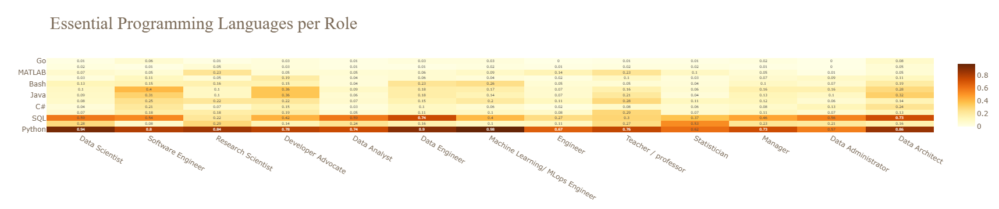

In [52]:
languages_columns = [col for col in scope_df.columns if col.startswith("Q12")]
languages_columns = languages_columns[0:len(languages_columns)-2]
x = list(scope_df[scope_df["Q23"] != "Other"]["Q23"].apply(lambda x : x.split("(")[0]).unique())
y = []
for col in languages_columns:
    y.append(scope_df[col].value_counts().index[0])

z = []

    
for col in languages_columns:
    tmp = []
    for role in list(scope_df[scope_df["Q23"] != "Other"]["Q23"].unique()) :
        if len(scope_df[scope_df["Q23"] == role][col].value_counts().values) > 0:
            languages_usage = scope_df[scope_df["Q23"] == role][col].value_counts().values[0]
        else:
            languages_usage = 0.00
        tmp.append(round(( languages_usage / scope_df[scope_df["Q23"] == role].shape[0]),2)) 
    
    z.append(tmp)

fig = go.Figure(data=go.Heatmap(
                   z=z,
                   x=x,
                   y=y,
    colorscale='YlorBr',
                   ))

large_title_format = "<span style='font-size:30px; font-family:Times New Roman'>Essential Programming Languages per Role</span>"

layout = dict(
    title = large_title_format,
    font = dict(color = '#7b6b59'),

)


fig['layout'].update(layout)
fig.update_traces(text=z, texttemplate="%{text}")

fig.show()

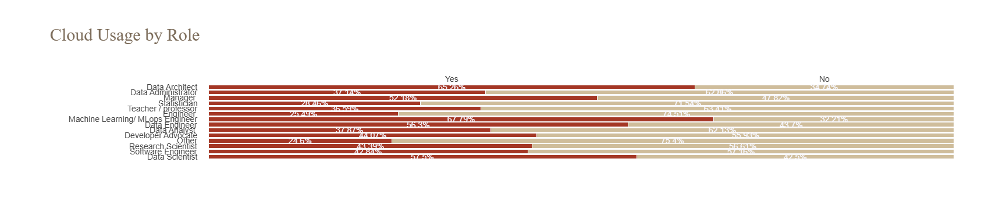

In [53]:
cloud_usage = scope_df.groupby(["Q23", "Cloud_usage"]).agg({"Q2" : "count"}).reset_index().rename(columns={"Q2": "counts"})

top_labels = ['Yes', 'No']
colors = ['#a43725', '#cfbd9b']

x_data = []

for role in list(scope_df["Q23"].unique()):
    yes = cloud_usage[
        (cloud_usage["Q23"] == role) &
        (cloud_usage["Cloud_usage"] == "Yes")
    ].iloc[0]['counts']
    no = cloud_usage[
        (cloud_usage["Q23"] == role) &
        (cloud_usage["Cloud_usage"] == "No")
    ].iloc[0]['counts']
    sum_total = yes + no 
    x_data.append([round( (yes /sum_total) * 100, 2), round( (no /sum_total) * 100, 2) ])

y_data = list(scope_df["Q23"].apply(lambda x : x.split("(")[0]).unique())

fig = go.Figure()

for i in range(0, len(x_data[0])):
    for xd, yd in zip(x_data, y_data):
        fig.add_trace(go.Bar(
            x=[xd[i]], y=[yd],
            orientation='h',
            marker=dict(
                color=colors[i],
                line=dict(color='rgb(248, 248, 249)', width=1)
            )
        ))


        
large_title_format = "<span style='font-size:30px; font-family:Times New Roman'>Cloud Usage by Role</span>"
small_title_format = "<span style='font-size:14px; font-family:Helvetica'></b></span>"


fig.update_layout(
    xaxis=dict(
        showgrid=False,
        showline=False,
        showticklabels=False,
        zeroline=False,
        domain=[0.15, 1]
    ),
    yaxis=dict(
        showgrid=False,
        showline=False,
        showticklabels=False,
        zeroline=False,
    ),
    title = large_title_format + "<br>" + small_title_format,
    font = dict(color = '#7b6b59'),
    barmode='stack',
    paper_bgcolor='white',
    plot_bgcolor='white',
    margin=dict(l=120, r=10, t=140, b=80),
    showlegend=False,
)

annotations = []

for yd, xd in zip(y_data, x_data):
    annotations.append(dict(xref='paper', yref='y',
                            x=0.14, y=yd,
                            xanchor='right',
                            text=str(yd),
                            font=dict(family='Arial', size=14,
                                      color='rgb(67, 67, 67)'),
                            showarrow=False, align='right'))
    annotations.append(dict(xref='x', yref='y',
                            x=xd[0] / 2, y=yd,
                            text=str(xd[0]) + '%',
                            font=dict(family='Arial', size=14,
                                      color='rgb(248, 248, 255)'),
                            showarrow=False))
    if yd == y_data[-1]:
        annotations.append(dict(xref='x', yref='paper',
                                x=xd[0] / 2, y=1.1,
                                text=top_labels[0],
                                font=dict(family='Arial', size=14,
                                          color='rgb(67, 67, 67)'),
                                showarrow=False))
    space = xd[0]
    for i in range(1, len(xd)):
            annotations.append(dict(xref='x', yref='y',
                                    x=space + (xd[i]/2), y=yd,
                                    text=str(xd[i]) + '%',
                                    font=dict(family='Arial', size=14,
                                              color='rgb(248, 248, 255)'),
                                    showarrow=False))
            if yd == y_data[-1]:
                annotations.append(dict(xref='x', yref='paper',
                                        x=space + (xd[i]/2), y=1.1,
                                        text=top_labels[i],
                                        font=dict(family='Arial', size=14,
                                                  color='rgb(67, 67, 67)'),
                                        showarrow=False))
            space += xd[i]

fig.update_layout(annotations=annotations)

fig.show()


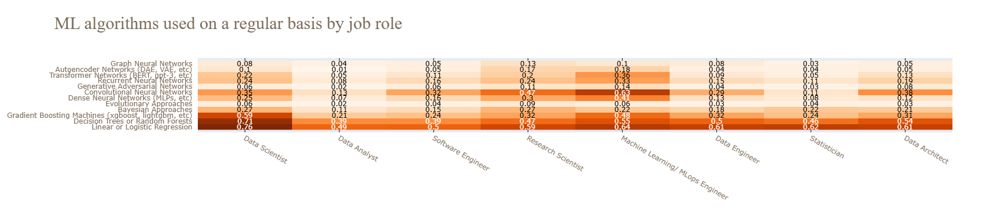

In [54]:
roles_in_scope = [
    "Data Scientist",
    "Data Analyst (Business, Marketing, Financial, Quantitative, etc)",
    "Software Engineer",
    "Research Scientist",
    "Machine Learning/ MLops Engineer",
    "Data Engineer",
    "Statistician",
    "Data Architect" 
]

ml_algorithms = [col for col in scope_df.columns if col.startswith("Q18")]
# Exclude None and others
ml_algorithms = ml_algorithms[:-2]
ml_algorithms_values = [scope_df[col].value_counts().index.to_list()[0].strip() for col in ml_algorithms]

x = [
    "Data Scientist",
    "Data Analyst",
    "Software Engineer",
    "Research Scientist",
    "Machine Learning/ MLops Engineer",
    "Data Engineer",
    "Statistician",
    "Data Architect" 
]
y = ml_algorithms_values

z = []

for alogithm in ml_algorithms:
    tmp = []
    for role in roles_in_scope:
        tmp.append(round((scope_df[scope_df["Q23"] == role][alogithm].count() / scope_df[scope_df["Q23"] == role].shape[0]),2)) 
    
    z.append(tmp)

fig = ff.create_annotated_heatmap(z, x=x, y=y, annotation_text=z,  colorscale='Oranges')

large_title_format = "<span style='font-size:30px; font-family:Times New Roman'> ML algorithms used on a regular basis by job role</span>"

layout = dict(
    title = large_title_format,
    font = dict(color = '#7b6b59'),

)


fig['layout'].update(layout)
fig["layout"]["xaxis"].update(side="bottom")
fig.show()


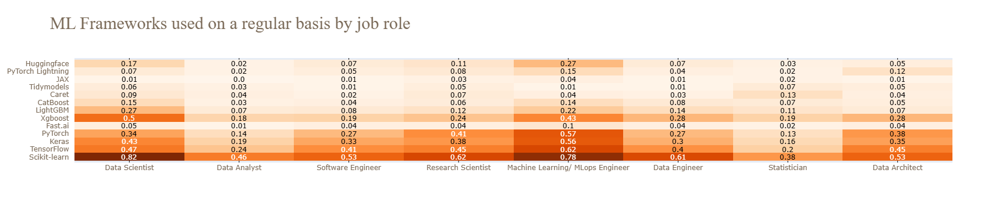

In [55]:
roles_in_scope = [
    "Data Scientist",
    "Data Analyst (Business, Marketing, Financial, Quantitative, etc)",
    "Software Engineer",
    "Research Scientist",
    "Machine Learning/ MLops Engineer",
    "Data Engineer",
    "Statistician",
    "Data Architect" 
]

ml_frameworks = [col for col in scope_df.columns if col.startswith("Q17")]
ml_frameworks = ml_frameworks[:-2]
ml_frameworks_values = [scope_df[col].value_counts().index.to_list()[0].strip() for col in ml_frameworks]

x = [
    "Data Scientist",
    "Data Analyst",
    "Software Engineer",
    "Research Scientist",
    "Machine Learning/ MLops Engineer",
    "Data Engineer",
    "Statistician",
    "Data Architect" 
]
y = ml_frameworks_values

z = []

for framework in ml_frameworks:
    tmp = []
    for role in roles_in_scope:
        tmp.append(round((scope_df[scope_df["Q23"] == role][framework].count() / scope_df[scope_df["Q23"] == role].shape[0]),2)) 
    
    z.append(tmp)

fig = ff.create_annotated_heatmap(z, x=x, y=y, annotation_text=z,  colorscale='Oranges')

large_title_format = "<span style='font-size:30px; font-family:Times New Roman'>ML Frameworks used on a regular basis by job role</span>"
 
layout = dict(
    title = large_title_format,
    font = dict(color = '#7b6b59'),

)


fig['layout'].update(layout)
fig["layout"]["xaxis"].update(side="bottom")

fig.show()

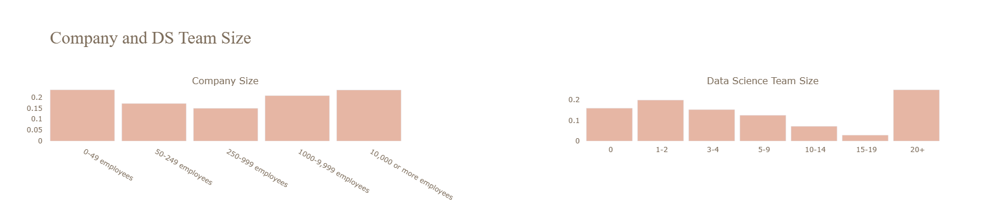

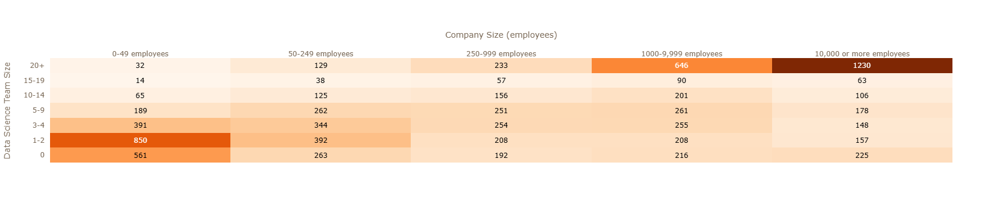

In [56]:
company_size_df = scope_df.groupby(["Q25"]).agg({"Q2" : "count"}).reset_index().rename(columns={"Q2": "counts"})
company_size_df["relative_percent"] = company_size_df.apply(lambda x : x["counts"] / scope_df.shape[0], axis = 1)
company_size_df = company_size_df.sort_values(by=["Q25"])
company_size_df["Q25"] = company_size_df["Q25"].apply(lambda x : x.split(".")[-1])


data_team_size_df = scope_df.groupby(["Q26"]).agg({"Q2" : "count"}).reset_index().rename(columns={"Q2": "counts"})
data_team_size_df["relative_percent"] = data_team_size_df.apply(lambda x : x["counts"] / scope_df.shape[0], axis = 1)
data_team_size_df = data_team_size_df.sort_values(by=["Q26"])
data_team_size_df["Q26"] = data_team_size_df["Q26"].apply(lambda x : x.split(".")[-1])


traces = dict()

trace_company_size = get_bar_plot_trace(
    company_size_df["Q25"].to_list(),
    company_size_df["relative_percent"].to_list(),
    np.round((company_size_df["relative_percent"] *100), decimals = 2),
    0, 
    company_size_df.shape[0]-0, 
    company_size_df["counts"].to_list(),
    orientation="v"
) 

trace_team_size = get_bar_plot_trace(
    data_team_size_df["Q26"].apply(lambda x : x.split("(")[0]),
    data_team_size_df["relative_percent"].to_list(),
    np.round((data_team_size_df["relative_percent"] *100), decimals = 2),
    0, 
    data_team_size_df.shape[0]-0, 
    data_team_size_df["counts"].to_list(),
    orientation="v"
) 


fig = make_subplots(
    rows=1, 
    cols=2 ,
    shared_yaxes=False, 
    shared_xaxes=True, 
    horizontal_spacing = 0.20, 
    vertical_spacing = 0.10,
    subplot_titles=("Company Size", "Data Science Team Size")
)
traces["company_size"] = trace_company_size
traces["team_size"] = trace_team_size

fig.append_trace(traces["company_size"],1,1)
fig.append_trace(traces["team_size"],1,2)            

large_title_format = "<span style='font-size:30px; font-family:Times New Roman'>Company and DS Team Size</span>"

layout = dict(
    title = large_title_format + "<br>",
    font = dict(color = '#7b6b59'),
    showlegend = False,
    margin = dict(t=150,pad=6),
    plot_bgcolor='#fff',
    bargap = 0.10,
)

fig['layout'].update(layout)

fig.show()

data_teams = [item for item in map_data_team_size.values() if not pd.isnull(item)]
company_size = [item for item in map_company_size.values() if not pd.isnull(item)]

z = []

for team in data_teams:
    tmp = []

    for company in company_size:
        
        tmp.append((scope_df[(scope_df["Q25"] == company) & (scope_df["Q26"] == team)].shape[0])) 
           
    z.append(tmp)


y = [item.split(".")[-1] for item in map_data_team_size.values() if not pd.isnull(item)]

test = ['0-49 employees',
 '50-249 employees',
 '250-999 employees',
 '1000-9,999 employees',
 '10,000 or more employees']


fig1 = ff.create_annotated_heatmap(z, x=test, y=y, colorscale='Oranges')
layout = go.Layout(
    xaxis= {"title": "Company Size (employees)"},
    yaxis= {"title": "Data Science Team Size"},
    font = dict(color = '#7b6b59'),
   
)

fig1.update_layout(layout)
fig1.show()

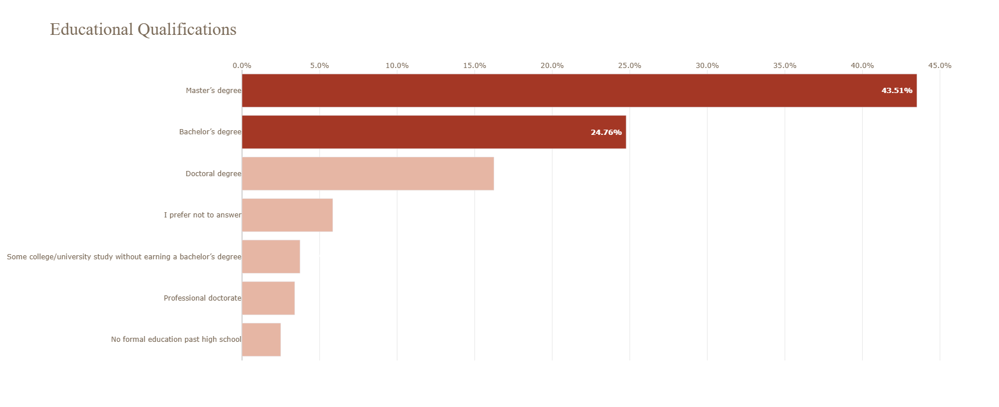

In [57]:
education_df = scope_df.groupby(["Q8"]).agg({"Q2" : "count"}).reset_index().rename(columns={col: "Q8", "Q2": "counts"})

education_df["relative_percent"] = education_df.apply(lambda x : (x["counts"] / scope_df.shape[0]), axis = 1)
education_df = education_df.sort_values(by=["relative_percent"], ascending=True)


create_single_bar_plot(
    x_values=education_df["relative_percent"].to_list(),
    y_values=education_df["Q8"].to_list(),
    display_text=np.round((education_df["relative_percent"] *100), decimals = 2),
    top_n=2,
    rest_n=education_df.shape[0]-2, 
    hovertext = education_df["counts"].to_list(),
    title="Educational Qualifications",
    subtitle="", 
    orientation="h"
)

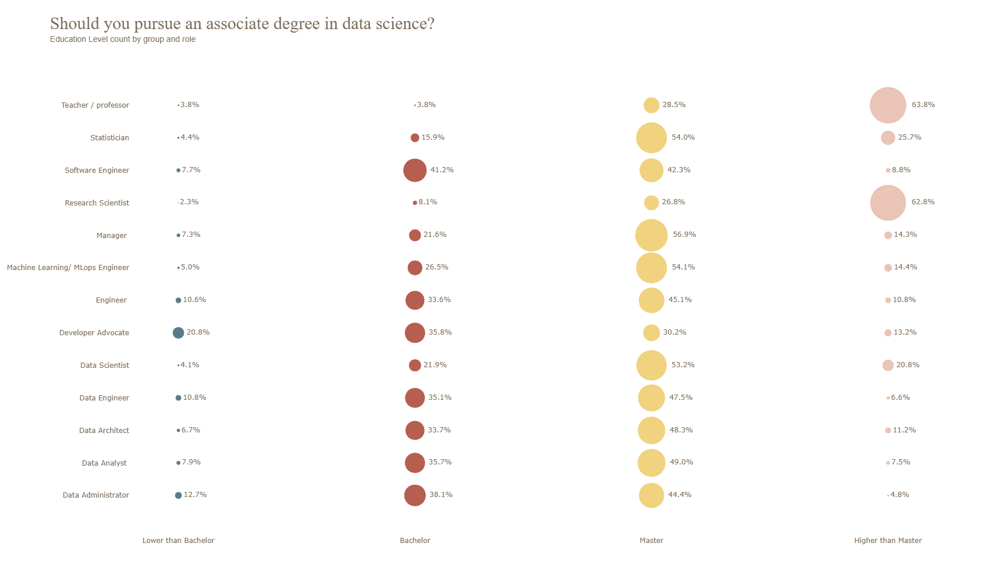

In [58]:
education_roles = scope_df[
    (scope_df["Q8"] != "I prefer not to answer") &
    (scope_df["Q23"] != "Other")
]

education_roles['Education_level'] = education_roles.apply(lambda row: categorize_education(row["Q8"]), axis=1)
education_roles = education_roles.groupby(["Education_level", "Q23"]).agg({"Q2" : "count"}).reset_index().rename(columns={"Q2": "counts"})


role_choices = list(education_roles["Q23"].unique())
education_choices = [
    "Lower than Bachelor",
    "Bachelor",
    "Master",
    "Higher than Master"
]
x = []
for education_level in education_choices:
    x.extend([education_level] * len(role_choices))

marker_size = []
text_markers = []
for education in education_choices:
    for con in role_choices:
        try:
            per = (education_roles[
                (education_roles["Q23"] == con) &
                (education_roles["Education_level"] == education)
            ].iloc[0]["counts"] / education_roles[education_roles["Q23"] == con]["counts"].sum()) *100
            marker_size.append(per)
            text_markers.append(str(round(per, 1))+"%")
        except IndexError as e:
            marker_size.append(0)
        
roles = []
for role in role_choices:
    roles.append(role.split("(")[0])
    
trace = go.Scatter(
    x = x, 
    y = roles*4, 
    mode='markers+text', 
    textposition="middle right", 
    text=text_markers, 
    name="", 
    marker=dict(color=["#325C6E"]*len(role_choices)+["#a43725"]*len(role_choices)+["#edc860"]*len(role_choices)+["#E6b6a4"]*len(role_choices), opacity=0.8, size = marker_size))


large_title_format = "<span style='font-size:30px; font-family:Times New Roman'>Should you pursue an associate degree in data science?</span>"
small_title_format = "<span style='font-size:14px; font-family:Helvetica'>Education Level count by group and role</b></span>"



    
layout = go.Layout(barmode='stack', margin=dict(l=200), height=1000, title = large_title_format + "<br>" + small_title_format,  font = dict(color = '#7b6b59'),
                       legend = dict(orientation="h", x=0.1, y=1.15), plot_bgcolor='#fff', paper_bgcolor='#fff', 
                       showlegend=False)

fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

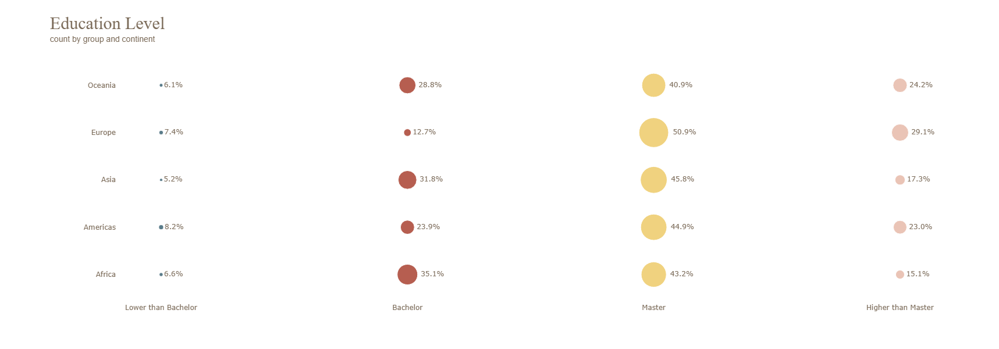

In [59]:
education_countries = pd.merge(scope_df.rename(columns={"Q4": "country"}), countries_df, on=["country"], how="left")


education_countries["continent"] = education_countries.apply(lambda x : fix_map_country_continent(map_country_continent, x["country"], x["continent"]), axis = 1)
education_countries = education_countries[
    (education_countries["continent"].notnull())&
    (education_countries["Q8"] != "I prefer not to answer")
]

education_countries['Education_level'] = education_countries.apply(lambda row: categorize_education(row["Q8"]), axis=1)

education_countries = education_countries.groupby(["Education_level", "continent"]).agg({"Q2" : "count"}).reset_index().rename(columns={"Q2": "counts"})


continent_choices = list(education_countries["continent"].unique())
education_choices = [
    "Lower than Bachelor",
    "Bachelor",
    "Master",
    "Higher than Master"
]
x = []
for education_level in education_choices:
    x.extend([education_level] * len(continent_choices))

marker_size = []
text_markers = []
for education in education_choices:
    for con in continent_choices:
        try:
            per = (education_countries[
                (education_countries["continent"] == con) &
                (education_countries["Education_level"] == education)
            ].iloc[0]["counts"] / education_countries[education_countries["continent"] == con]["counts"].sum()) *100
            marker_size.append(per)
            text_markers.append(str(round(per, 1))+"%")
        except IndexError as e:
            marker_size.append(0)
        
trace = go.Scatter(
    x = x, 
    y = continent_choices*4, 
    mode='markers+text', 
    textposition="middle right", 
    text=text_markers, 
    name="", 
    marker=dict(color=["#325C6E"]*len(continent_choices)+["#a43725"]*len(continent_choices)+["#edc860"]*len(continent_choices)+["#E6b6a4"]*len(continent_choices), opacity=0.8, size = marker_size))


large_title_format = "<span style='font-size:30px; font-family:Times New Roman'>Education Level</span>"
small_title_format = "<span style='font-size:14px; font-family:Helvetica'>count by group and continent</b></span>"



    
layout = go.Layout(barmode='stack', margin=dict(l=200), height=600, title = large_title_format + "<br>" + small_title_format, font = dict(color = '#7b6b59'),
                       legend = dict(orientation="h", x=0.1, y=1.15), plot_bgcolor='#fff', paper_bgcolor='#fff', 
                       showlegend=False)

fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

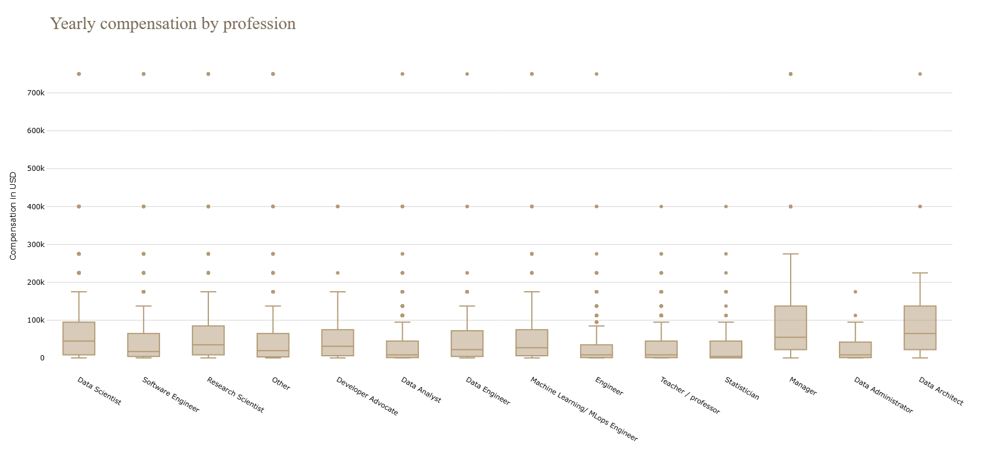

In [60]:
scope_df[['min_w','max_w']]=scope_df['Q29'].str.replace('$', '', regex=False).str.replace(',', '', regex=False).str.replace('>', '', regex=False).str.split('-', expand = True)
scope_df[['min_w','max_w']] = scope_df[['min_w','max_w']].astype('float')
scope_df['Mean_Compensation']=(scope_df['min_w']+scope_df['max_w'])/2 + 0.5

scope_df["Q23"] = scope_df["Q23"].apply(lambda x : x.split("(")[0]).to_list()

create_box_plot(scope_df,"Q23", "Mean_Compensation",  "Yearly compensation by profession")


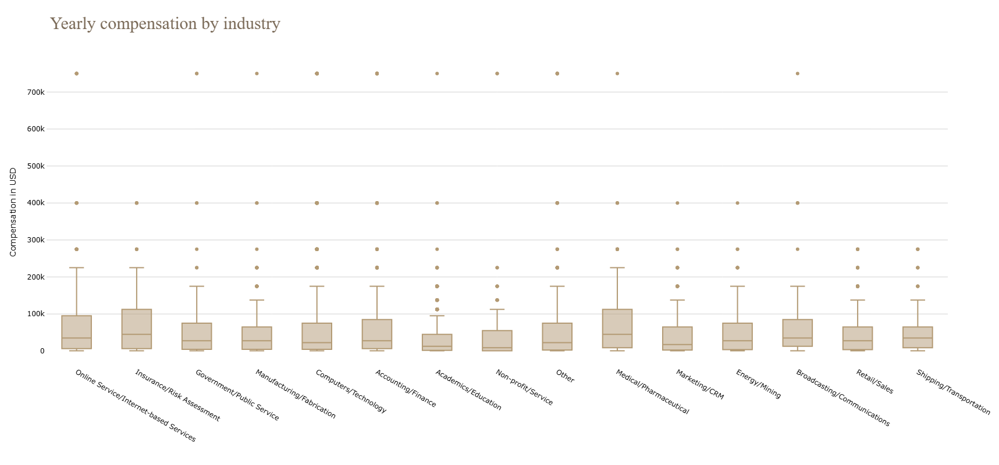

In [61]:
create_box_plot(scope_df,"Q24", "Mean_Compensation",  "Yearly compensation by industry")

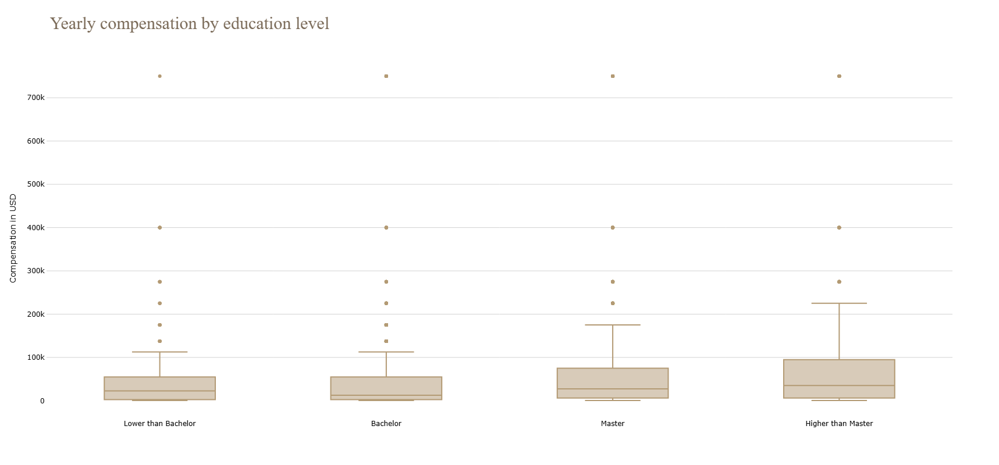

In [62]:
scope_df['Education_level'] = scope_df.apply(lambda row: categorize_education(row["Q8"]), axis=1)

map_education = {
    "Lower than Bachelor": "1. Lower than Bachelor" , 
    "Bachelor": "2. Bachelor",
    "Master": "3. Master",
    "Higher than Master": "4. Higher than Master",
    "Other": "Other"
        
}

results = scope_df
results["Education_level"] = results["Education_level"].apply(lambda x : map_education[x])
results = results.sort_values(by=["Education_level"])
results["Education_level"] = results["Education_level"].apply(lambda x : x.split(".")[-1].strip()).to_list()
results = results[results["Education_level"] != "Other"]

create_box_plot(results,"Education_level", "Mean_Compensation",  "Yearly compensation by education level")


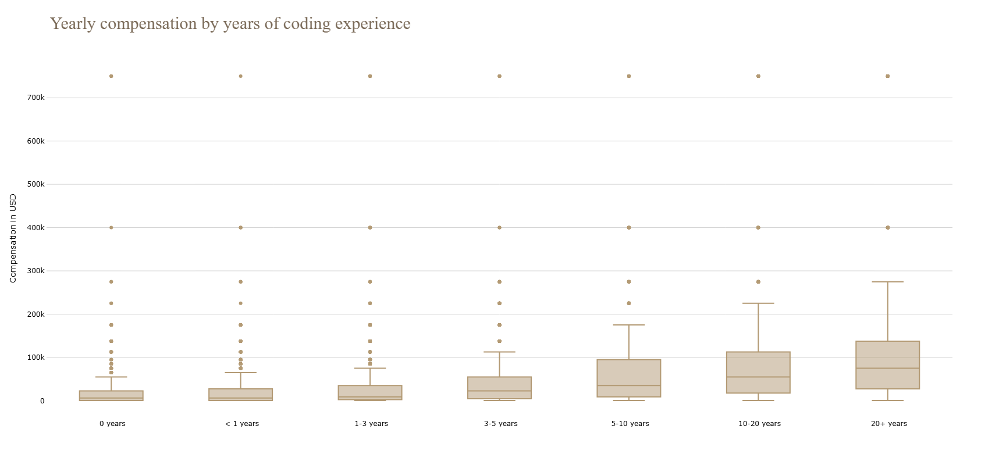

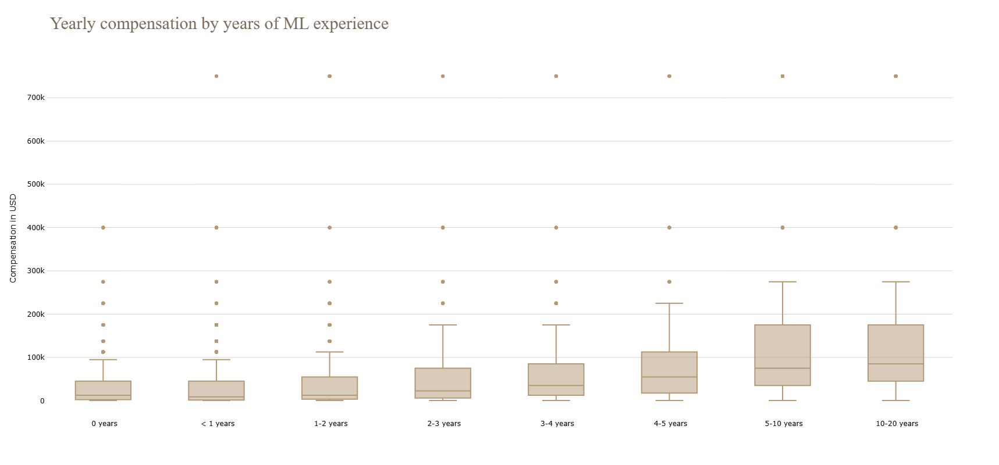

In [63]:
tmp = scope_df.sort_values(by=["Q11"])
tmp = tmp[tmp["Q11"].notnull()]
tmp["Q11"] = tmp["Q11"].apply(lambda x : x.split(".")[-1])

create_box_plot(tmp, "Q11", "Mean_Compensation",  "Yearly compensation by years of coding experience")

tmp = scope_df.sort_values(by=["Q16"])
tmp = tmp[tmp["Q16"].notnull()]
tmp["Q16"] = tmp["Q16"].apply(lambda x : x.split(".")[-1])

create_box_plot(tmp, "Q16", "Mean_Compensation",  "Yearly compensation by years of ML experience")

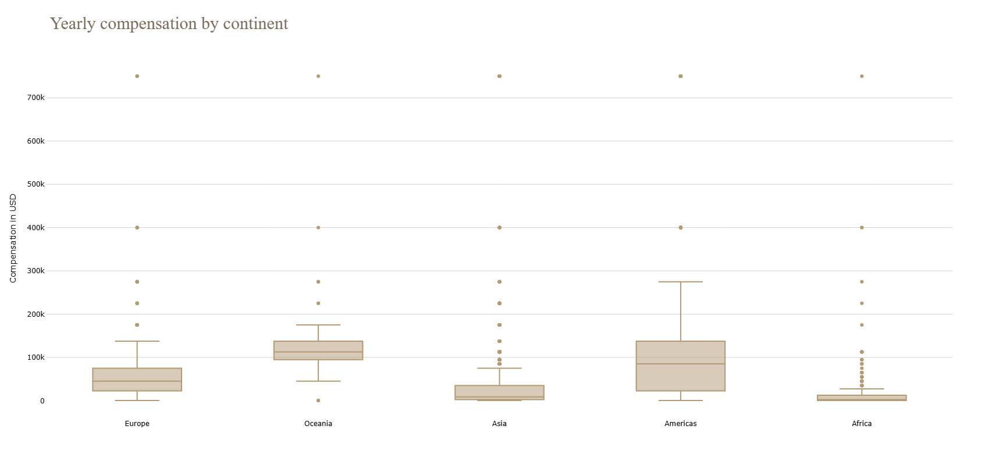

In [64]:
education_countries = pd.merge(scope_df.rename(columns={"Q4": "country"}), countries_df, on=["country"], how="left")

education_countries["continent"] = education_countries.apply(lambda x : fix_map_country_continent(map_country_continent, x["country"], x["continent"]), axis = 1)

create_box_plot(education_countries, "continent", "Mean_Compensation",  "Yearly compensation by continent")

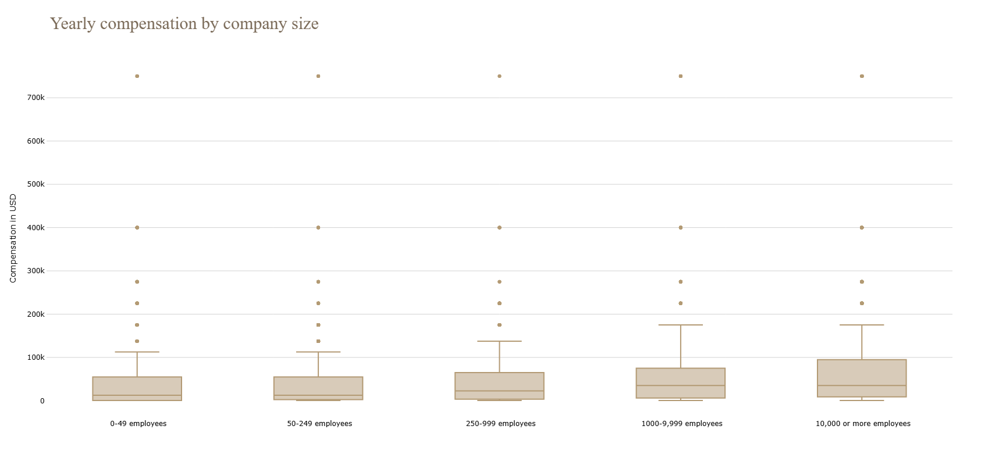

In [65]:
tmp = scope_df.sort_values(by=["Q25"])
tmp = tmp[tmp["Q25"].notnull()]
tmp["Q25"] = tmp["Q25"].apply(lambda x : x.split(".")[-1])

create_box_plot(tmp, "Q25", "Mean_Compensation",  "Yearly compensation by company size")